https://christophm.github.io/interpretable-ml-book/simple.html

# Part 1 Classification

![](https://www.sciencealert.com/images/articles/processed/titanic-1_1024.jpg)
- reference : pycaret package - https://pycaret.org/

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import qgrid  # for interactive dataframe view
import sweetviz as sv # for easy data status and relationship X-X and X-Y
from pycaret.classification import *  # for fast base-line model setup

sns.set_style("ticks")

In [2]:
# custom function define


## for EDA - Binning | Counts | Ratio : Now this is not required function, Look Sweetviz results~!
def ratio_plot(dataset0, Y_Cols):
    cols_float = dataset0.dtypes[dataset0.dtypes == float].index
    cols_object = dataset0.dtypes[dataset0.dtypes == object].index
    ratio_df_list = []
    dataset_bin = dataset0.copy()
    for col_i in dataset0.columns[:-1]:
        if col_i in cols_float:
            dataset_bin[col_i] = pd.qcut(dataset[col_i],
                                         q=5,
                                         duplicates='drop')

        rst_df = pd.DataFrame()
        cnt = dataset_bin.groupby(col_i)[Y_Cols].count()
        sum_1 = dataset_bin.groupby(col_i)[Y_Cols].sum()
        rst_df = pd.concat((cnt, sum_1), axis=1)
        rst_df.columns = ['count', 'sum']
        rst_df['ratio'] = rst_df['sum'] / rst_df['count']
        ratio_df_list.append(rst_df)

    for df_ratio_i in ratio_df_list:

        labels = [str(i) for i in df_ratio_i.index]
        fig, ax = plt.subplots()
        ax.bar(labels, df_ratio_i[df_ratio_i.columns[0]], label='ALL')
        ax.bar(labels, df_ratio_i[df_ratio_i.columns[1]], label=f"{Y_Cols}")

        ax.set_ylabel(f"Count All and {Y_Cols}", color="black", fontsize=14)
        ax.set_xlabel(df_ratio_i.index.name)
        ax.set_xticks(labels)

        ax2 = ax.twinx()
        ax2.plot(labels,
                 df_ratio_i[df_ratio_i.columns[2]],
                 color="blue",
                 marker="o")
        ax2.set_ylabel("Ratio", color="blue", fontsize=14)

        ylim1 = ax.get_ylim()
        len1 = ylim1[1] - ylim1[0]
        yticks1 = ax.get_yticks()
        rel_dist = [(y - ylim1[0]) / len1 for y in yticks1]
        ylim2 = ax2.get_ylim()
        len2 = ylim2[1] - ylim2[0]
        yticks2 = [ry * len2 + ylim2[0] for ry in rel_dist]
        ax2.set_yticks(yticks2)
        ax2.set_ylim(
            ylim2
        )  #<-- this line is needed to re-adjust the limits to the original values

        # Just add a title and rotate the x-axis labels to be horizontal.
        plt.title(f'Counts and Ratio for {df_ratio_i.index.name}')
        plt.xticks(rotation=90, ha='center')
        plt.show()


## Feature Importance - Tree|MDI based Classifica Feature Imp. VS. permutation Feature Imp.
def FI(model, dataset, X_Cols, Y_Cols):
    X_names = np.array(X_Cols)

    fig = plt.figure()
    try:
        model_FI = model.feature_importances_  #tuned_model
        sorted_idx = model_FI.argsort()
        y_ticks = np.arange(0, len(X_names))
        ax = plt.subplot(121)
        ax.barh(y_ticks, model_FI[sorted_idx])
        ax.set_yticks(y_ticks)
        ax.set_yticklabels(X_names[sorted_idx])
        ax.set_title("Feature Importances (MDI:Mean Decrease in Impurity")
    except:
        print("FI failed")
        pass

    from sklearn.inspection import permutation_importance

    try:
        result = permutation_importance(
            model,
            dataset[dataset.isna().sum(axis=1) == 0][X_names],
            dataset[dataset.isna().sum(axis=1) == 0][Y_Cols],
            n_repeats=10,
            random_state=42,
            n_jobs=2)
        sorted_idx = result.importances_mean.argsort()

        ax = plt.subplot(122)
        ax.boxplot(result.importances[sorted_idx].T,
                   vert=False,
                   labels=X_names[sorted_idx])
        ax.set_title("Permutation Importances (train set)")
    except:
        print("PFI failed")
        pass
    fig.tight_layout()
    fig.show()

In [3]:
train = pd.read_csv('./input/titanic/train.csv')
test = pd.read_csv('./input/titanic/test.csv')
sub = pd.read_csv('./input/titanic/gender_submission.csv')

In [4]:
# add random variable to interpret Feature Importance
rng = np.random.RandomState(seed=42)

train["random_cat"] = rng.randint(3, size=train.shape[0])
train["random_num"] = rng.randn(train.shape[0])

test["random_cat"] = rng.randint(3, size=test.shape[0])
test["random_num"] = rng.randn(test.shape[0])

## Check Data

In [5]:
qgrid.show_grid(train, grid_options={'maxVisibleRows': 5})

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

                                             |                                             | [  0%]   00:00 ->…


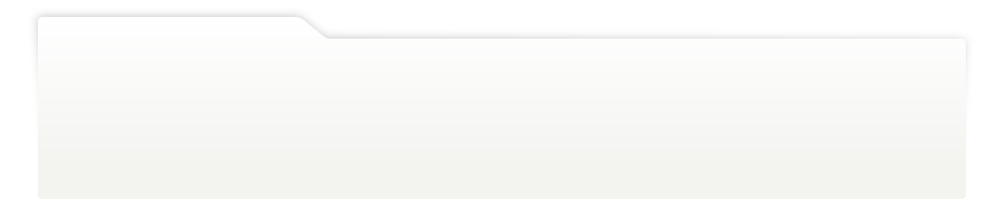
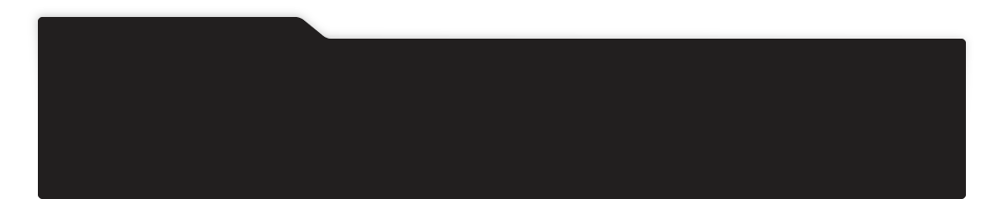
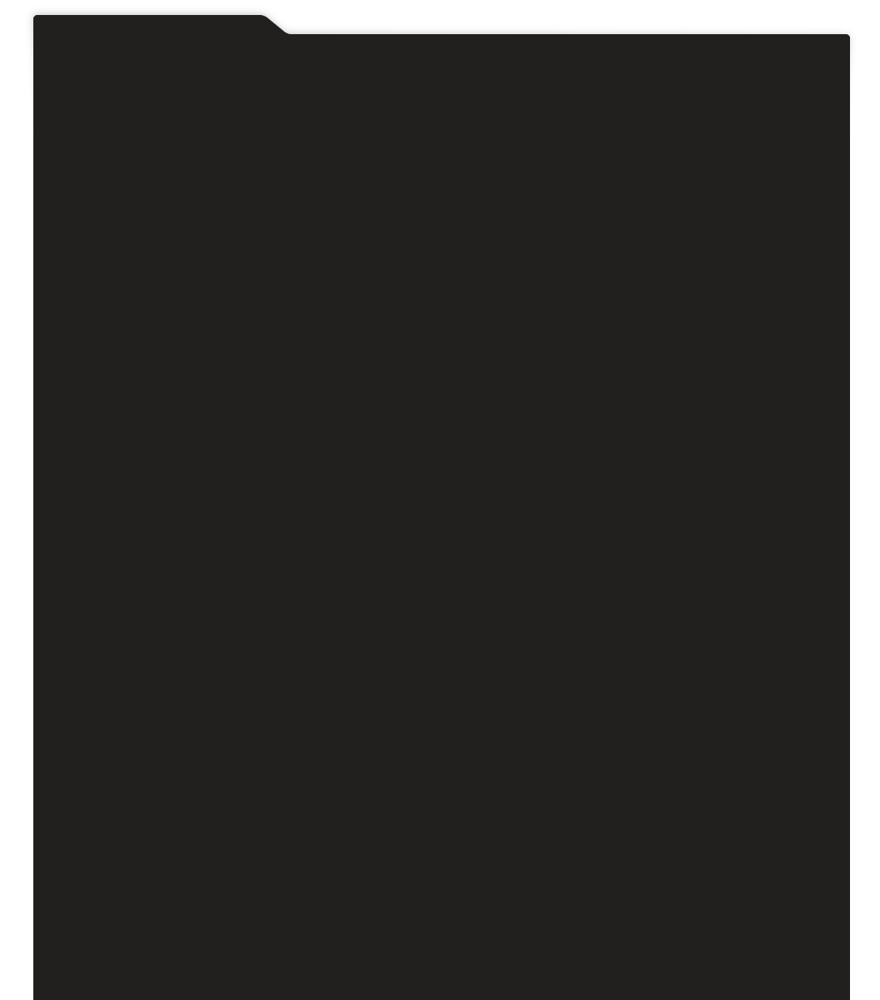
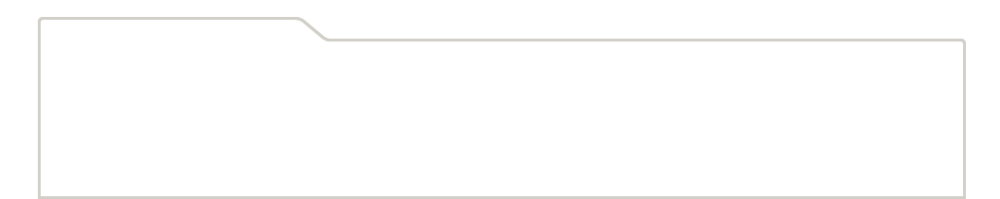
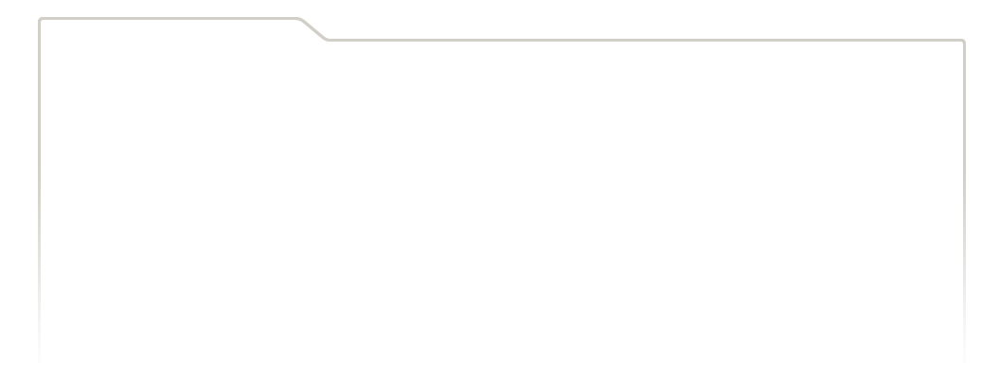
...
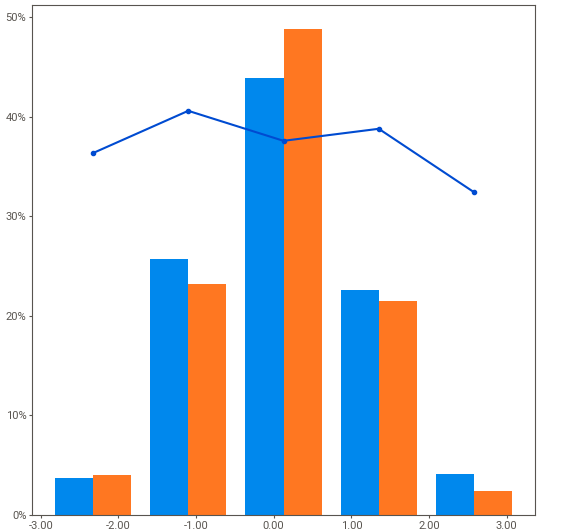
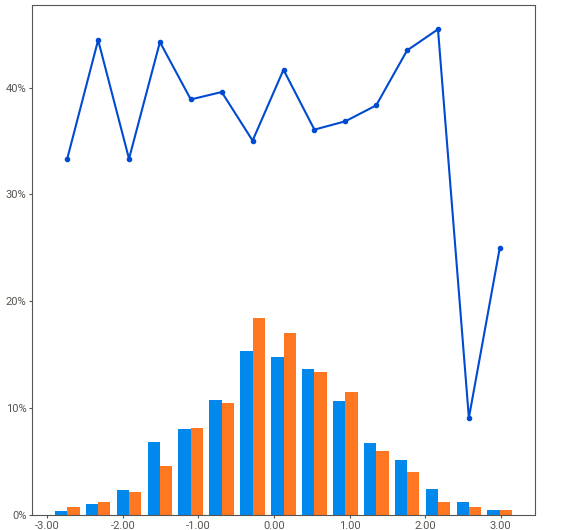
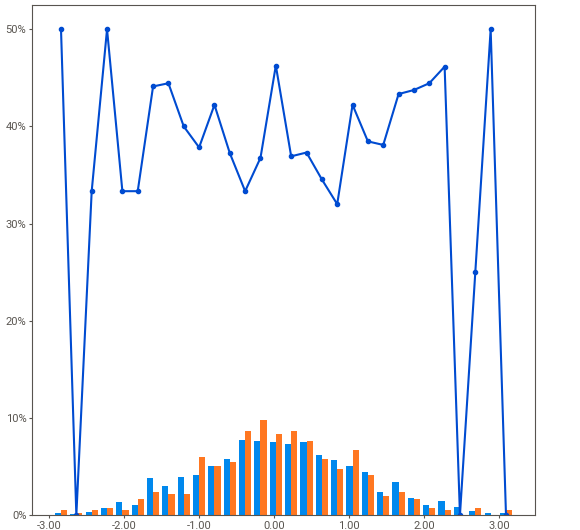
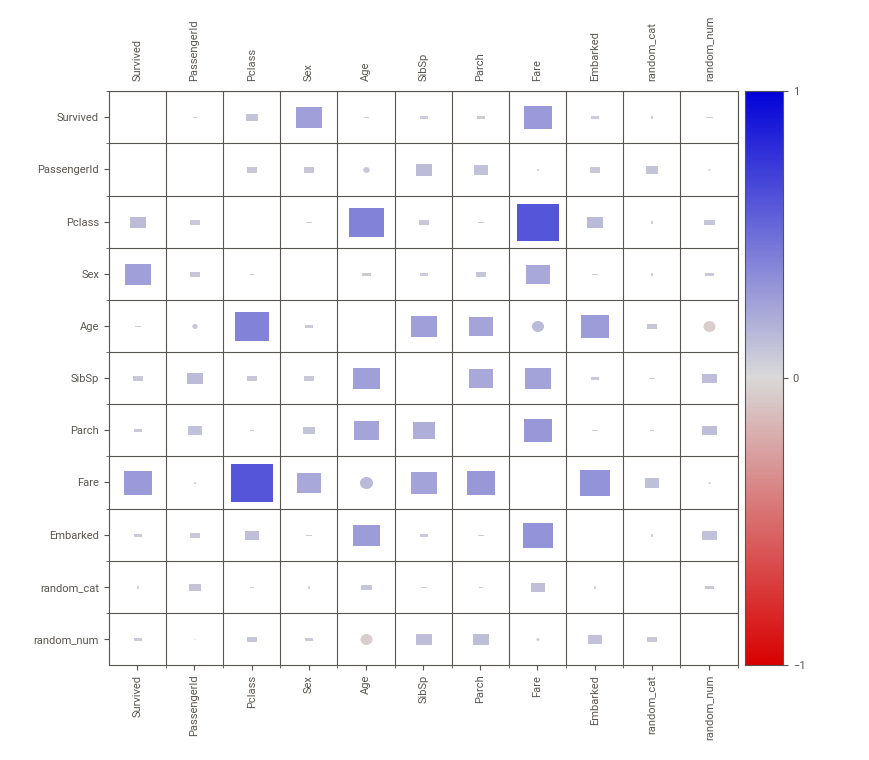
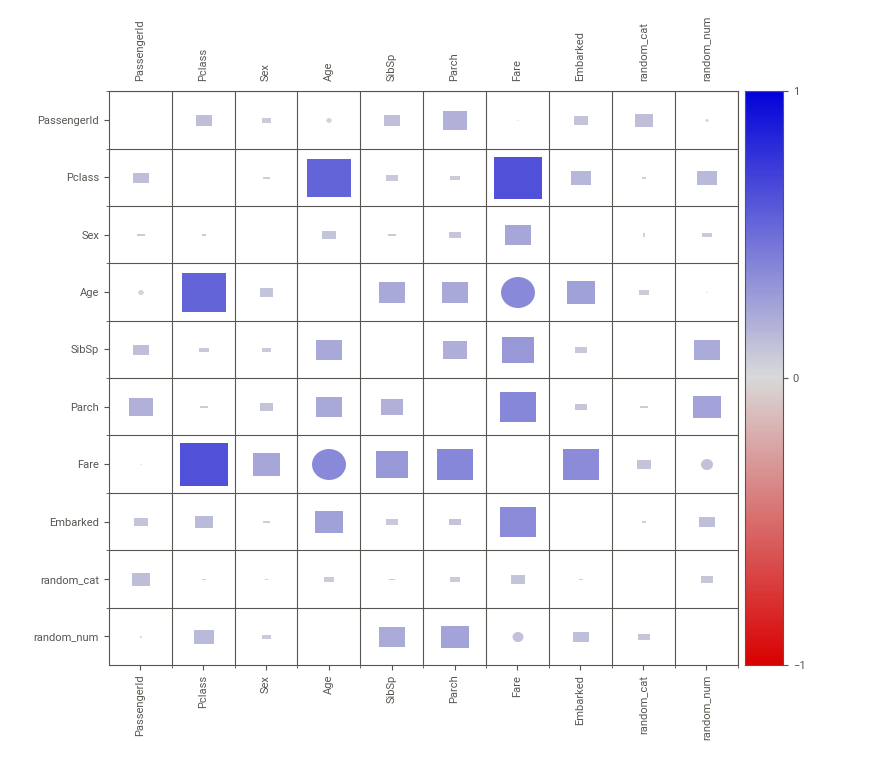

In [6]:
comparison_report = sv.compare([train, 'Train'], [test, 'Test'],
                               target_feat='Survived')
comparison_report.show_notebook(scale=0.8)

In [7]:
X_Cols = ['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked']
X_Cols_categ = ['Sex', 'Pclass']
X_Cols_Rand = ['random_cat', 'random_num']
Y_Cols = ['Survived']

dataset0 = train[X_Cols + X_Cols_Rand + Y_Cols]

dataset = dataset0.copy()

cols_float = dataset0.dtypes[dataset0.dtypes != float].index
cols_object = dataset0.dtypes[dataset0.dtypes == object].index

dataset.Sex = dataset.Sex.replace({'male': 0, 'female': 1})
dataset.Embarked = dataset.Embarked.replace({'S': 0, 'Q': 1, 'C': 2})

for col_i in dataset.columns:
    if col_i in cols_float:
        dataset[col_i] = dataset[col_i].astype(float)

qgrid.show_grid(dataset, grid_options={'maxVisibleRows': 5})

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

                                             |                                             | [  0%]   00:00 ->…


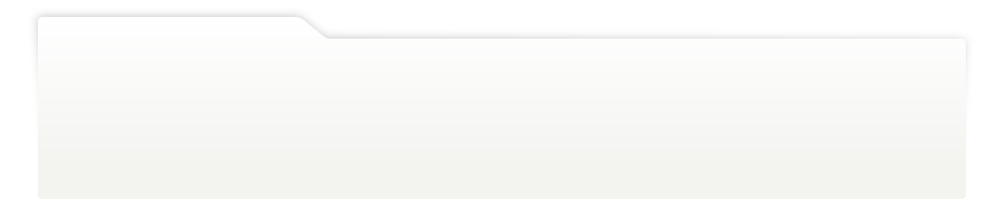
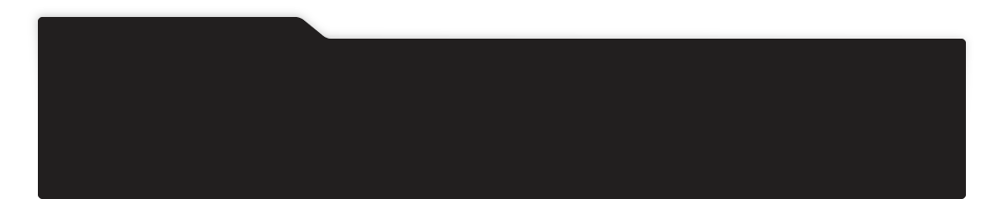
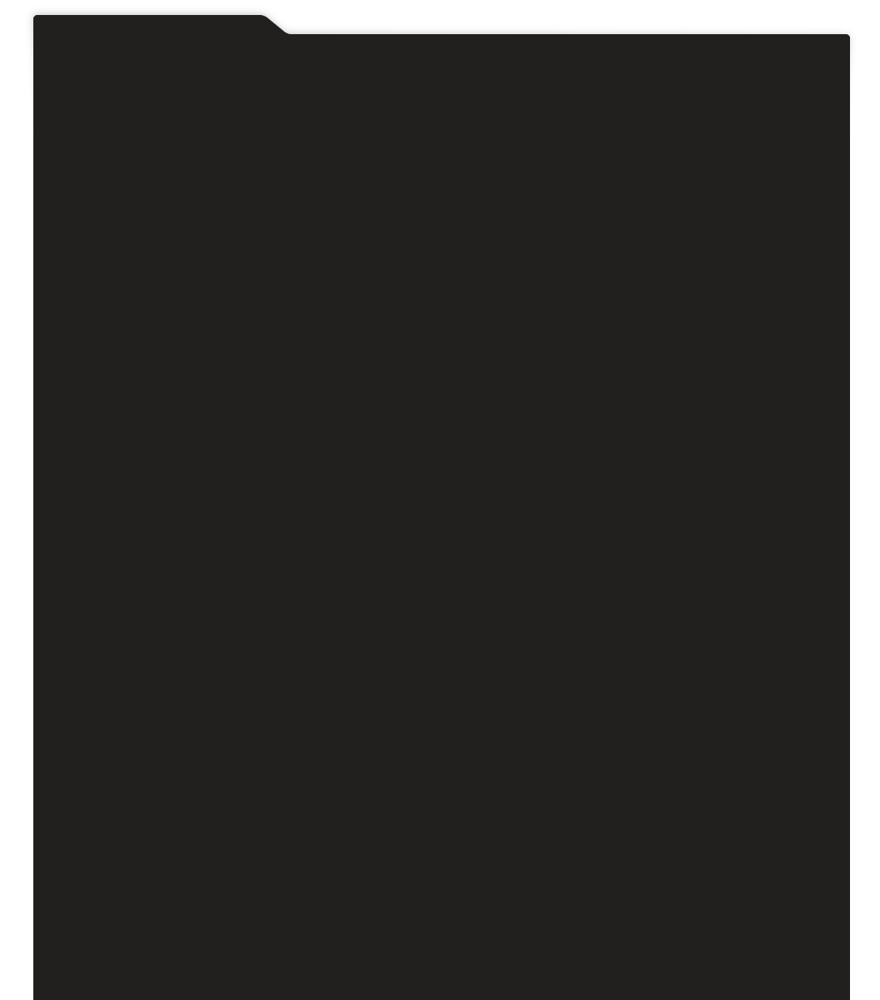
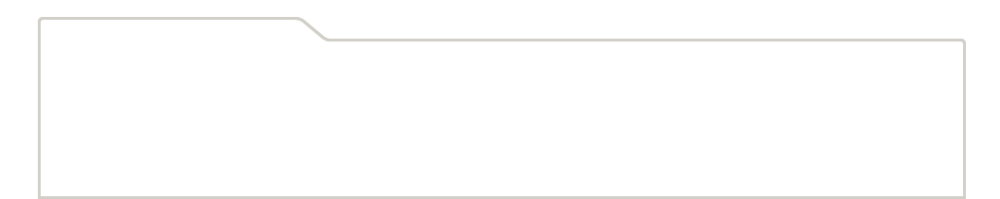
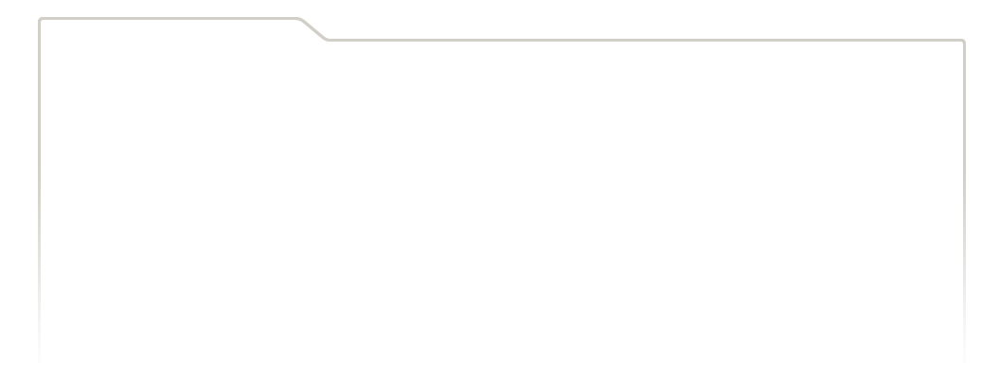
...
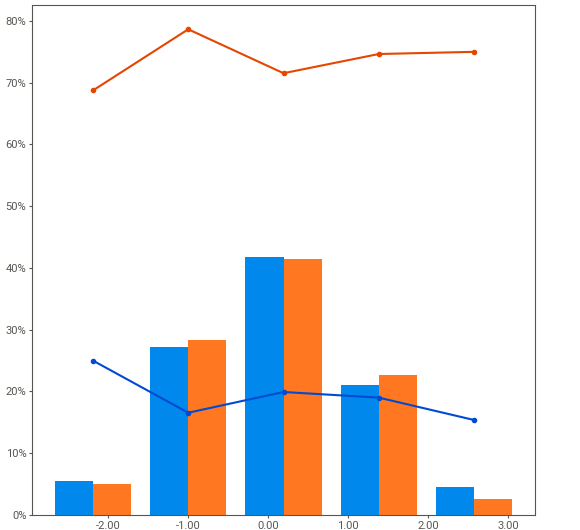
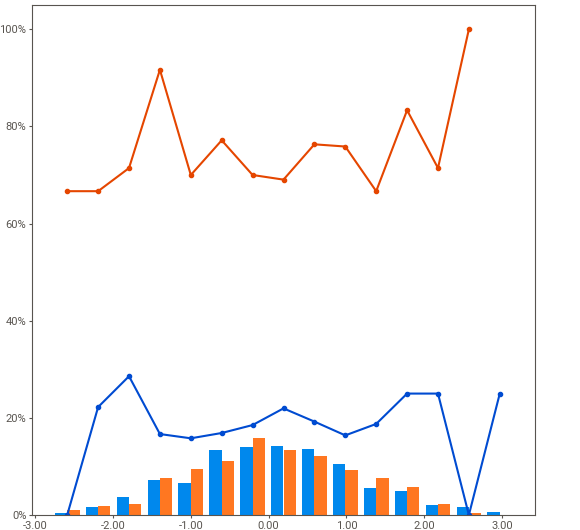
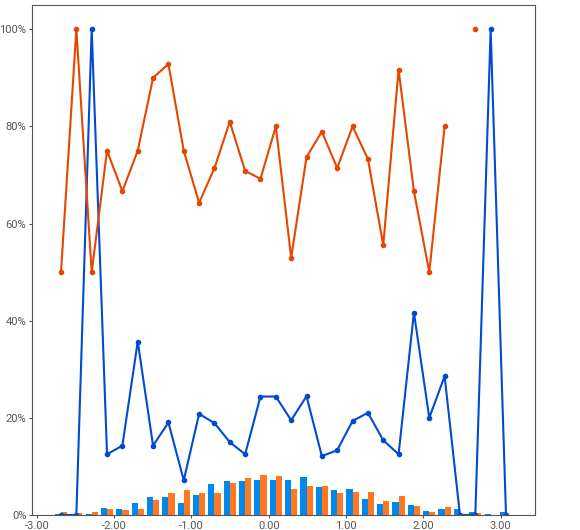
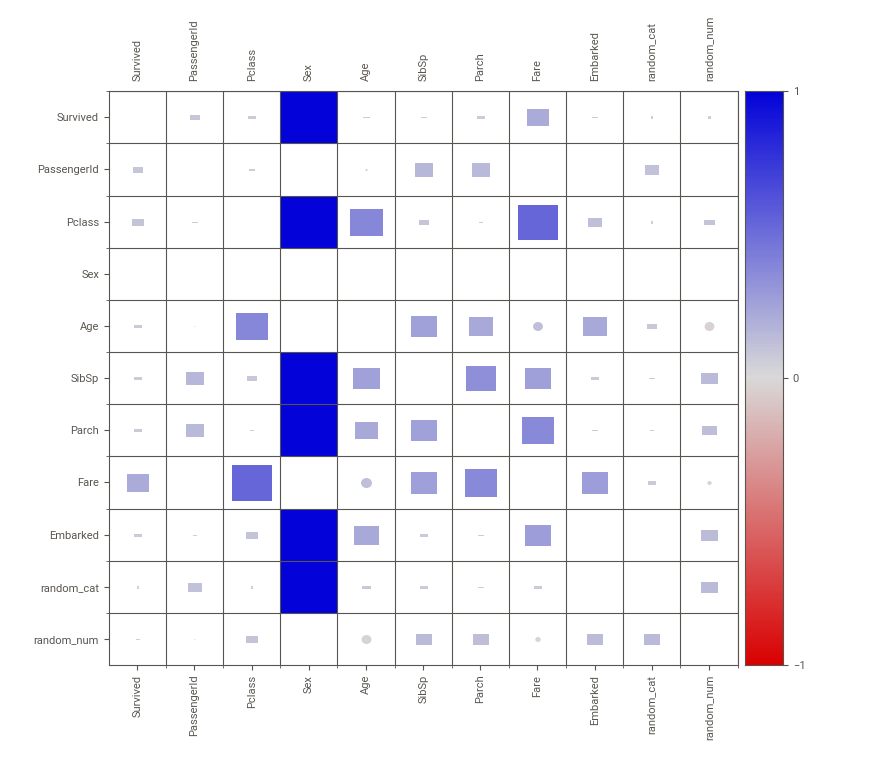
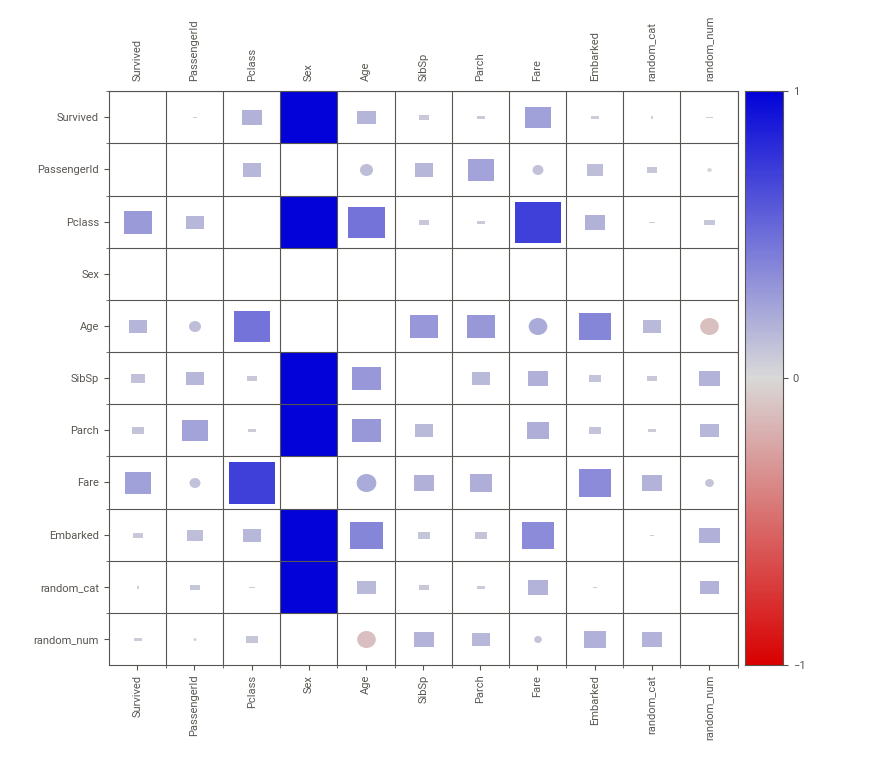

In [8]:
intra_report = sv.compare_intra(train, train["Sex"] == 'male',
                                ["Male", "Female"], 'Survived')
intra_report.show_notebook(w=900, h=450, scale=0.8)

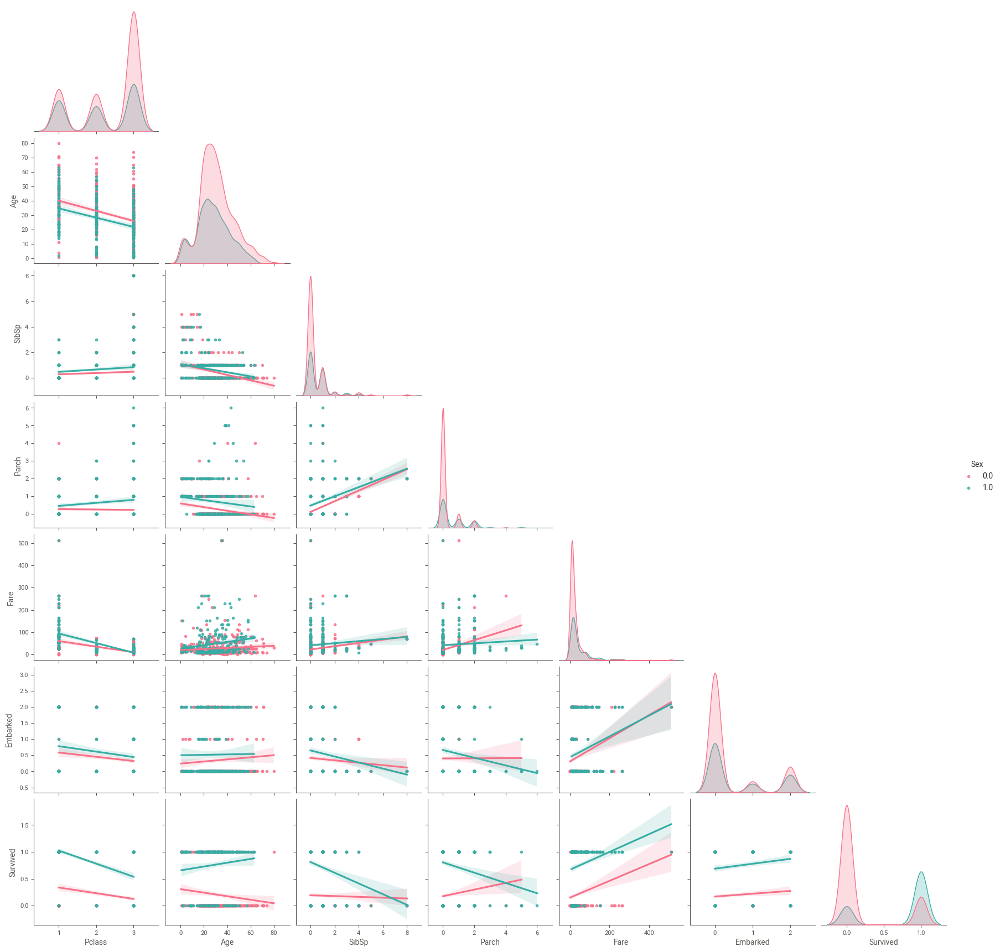

In [10]:
sns.pairplot(dataset[X_Cols + Y_Cols],
             hue='Sex',
             corner=True,
             palette='husl',
             kind='reg',
             diag_kws={'bw': 0.2})

## SetUp for Modeling

In [11]:
# One-Hot Encoded
'''
clf1 = setup(data = train, 
             #test_data = test,
             #normalize = True,
             target = 'Survived',
             remove_outliers = True,
             numeric_imputation = 'mean',
             categorical_features = ['Sex','Embarked'], 
             ignore_features = ['Name','Ticket','Cabin'],
             fold_shuffle=True, session_id=2,
             imputation_type='iterative',
             silent = True)

'''

#Categorical values are well ordered using integer
clf1 = setup(data = dataset, 
             #test_data = test,
             #normalize = True,
             target = 'Survived',
             remove_outliers = True,
             numeric_imputation = 'mean',
             #fold_shuffle=True, session_id=2,
             imputation_type='iterative',
             silent = True)

,Description,Value
0,session_id,7116
1,Target,Survived
2,Target Type,Binary
3,Label Encoded,"0.0: 0, 1.0: 1"
4,Original Data,"(891, 10)"
5,Missing Values,True
6,Numeric Features,7
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


## Select Model (Compare/Select/Tune)

### Compare ML algorithm

In [12]:
model_top18 = compare_models(n_select=18,exclude=['gpc'],turbo=False)
model_top3 = model_top18[:3]

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8089,0.8645,0.7112,0.7899,0.7442,0.5931,0.5986,0.0320
rf,Random Forest Classifier,0.8055,0.8550,0.7194,0.7781,0.7435,0.5878,0.5926,0.0760
catboost,CatBoost Classifier,0.8055,0.8632,0.6899,0.8008,0.7352,0.5836,0.5922,0.5720
lightgbm,Light Gradient Boosting Machine,0.8021,0.8563,0.7074,0.7820,0.7392,0.5806,0.5857,0.0560
ada,Ada Boost Classifier,0.7970,0.8228,0.7500,0.7440,0.7451,0.5766,0.5786,0.0350
mlp,MLP Classifier,0.7937,0.8492,0.6993,0.7670,0.7279,0.5628,0.5674,0.2990
et,Extra Trees Classifier,0.7903,0.8357,0.6937,0.7633,0.7223,0.5549,0.5603,0.0620
ridge,Ridge Classifier,0.7902,0.0000,0.6989,0.7599,0.7238,0.5558,0.5609,0.0070
lda,Linear Discriminant Analysis,0.7902,0.8480,0.6989,0.7599,0.7238,0.5558,0.5609,0.0070
xgboost,Extreme Gradient Boosting,0.7885,0.8464,0.6947,0.7567,0.7208,0.5517,0.5561,0.1340


### Ensemble Model create

In [13]:
blended_m = blend_models(estimator_list = model_top3, fold = 5, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7311,0.8439,0.5625,0.7105,0.6279,0.4218,0.4289
1,0.8475,0.8385,0.7447,0.8537,0.7955,0.6747,0.6787
2,0.8136,0.8927,0.7872,0.7551,0.7708,0.6138,0.6142
3,0.7797,0.8319,0.5532,0.8387,0.6667,0.5122,0.5370
4,0.8136,0.8870,0.7447,0.7778,0.7609,0.6082,0.6086
Mean,0.7971,0.8588,0.6785,0.7872,0.7243,0.5662,0.5735
SD,0.0393,0.0257,0.0997,0.0530,0.0651,0.0890,0.0851


### Stacking Model create

In [14]:
stacked_m = stack_models(estimator_list = model_top3, fold = 5, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7983,0.8589,0.6667,0.8000,0.7273,0.5694,0.5753
1,0.8051,0.8349,0.6809,0.8000,0.7356,0.5828,0.5876
2,0.8220,0.8846,0.7872,0.7708,0.7789,0.6300,0.6301
3,0.7542,0.8337,0.5319,0.7812,0.6329,0.4580,0.4772
4,0.8305,0.8981,0.7447,0.8140,0.7778,0.6412,0.6429
Mean,0.8020,0.8620,0.6823,0.7932,0.7305,0.5763,0.5826
SD,0.0265,0.0259,0.0869,0.0153,0.0532,0.0651,0.0585


### selected Model Tune

In [15]:
#model  = create_model('lightgbm')
model0  = model_top3[0]
#model  = model_top3[1]

In [16]:
tuned_model = tune_model(model0)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7167,0.7905,0.5833,0.6667,0.6222,0.3972,0.3994
1,0.8305,0.8762,0.7500,0.8182,0.7826,0.6441,0.6458
2,0.8644,0.8738,0.7917,0.8636,0.8261,0.7153,0.7171
3,0.8305,0.8631,0.7083,0.8500,0.7727,0.6394,0.6461
4,0.8475,0.8833,0.7917,0.8261,0.8085,0.6818,0.6823
5,0.7966,0.8452,0.7917,0.7308,0.7600,0.5840,0.5854
6,0.7119,0.7850,0.5217,0.6667,0.5854,0.3696,0.3761
7,0.7458,0.8249,0.5217,0.7500,0.6154,0.4345,0.4505
8,0.8475,0.8309,0.7826,0.8182,0.8000,0.6768,0.6772
9,0.8814,0.9010,0.8696,0.8333,0.8511,0.7525,0.7530


In [17]:
# get rstuls as dataframe 
tuned_model_df = pull(tuned_model)

## Evaluate Model

In [18]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

## Interpret Model Results

### Modelless : Correlation and Similarity among X-Y

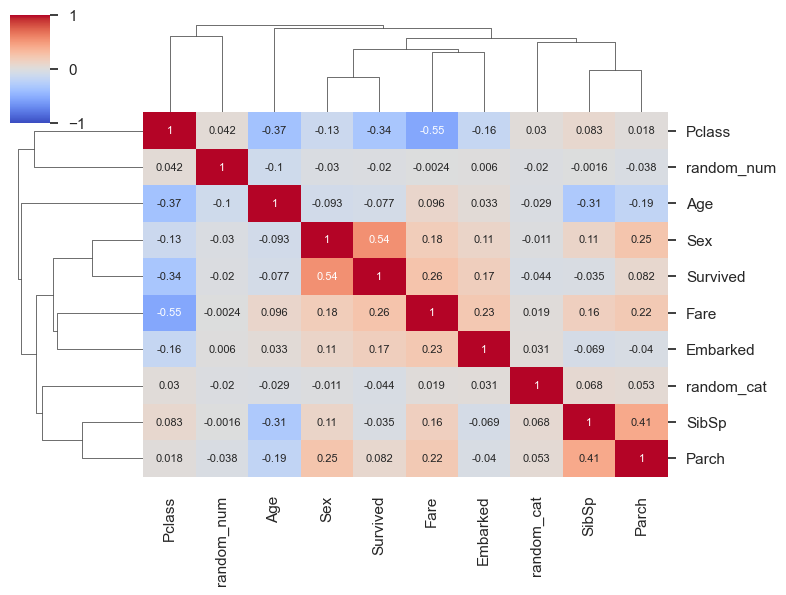

In [19]:
sns.set(font_scale=1.0)
corr = dataset.corr()

g = sns.clustermap(data=corr,
                   square=True,
                   annot=True,
                   cbar=True,
                   center=0,
                   vmin=-1,
                   vmax=1,
                   figsize=(8, 6),
                   annot_kws={"size": 8},
                   cmap="coolwarm")

- 변수 설명
> - survived : 생존=1, 죽음=0  
> - pclass : 승객 등급. 1등급=1, 2등급=2, 3등급=3  
> - sibsp : 함께 탑승한 형제 또는 배우자 수  
> - parch : 함께 탑승한 부모 또는 자녀 수  
> - ticket : 티켓 번호  
> - cabin : 선실 번호  
> - embarked : 탑승장소 S=Southhampton, C=Cherbourg, Q=Queenstown  

---

- We can easily see X-Y similarity using correlation matrix and dendrogram
    - Y 인자 ("Survived") 기준, Best Correlation "Gender", "SibSp", "P_Class" 순
        - 단순히 다른변수들과의 관계성이 존재하는 상황에서 여성의 경우, 부모/자녀가 있는 경우, 요금이 비싼 경우 생존확률 높음을 의미
        
    - X 인자들 기준
        - "Gender", "Fare", "Embarked" show relative good similarity (sign for correlation with the others)
        - "SibSp", "Parch" show ralative good similarity
            - SibSp, Parch 는 상관계수 0.4 수준의 중간 정도로 대가족이 탑승하는 경우 형제/배우자, 부모/자녀가 함께 타는 경향으로 해석
            - 형제/배우자 혹은 부모/자녀든 가족이 탑승하는 경우 티켓등급, 요금, 탑승장소가 유사한 경우가 존재함.


### Feature Importance
- Feature Importance (Model-Specific Global)
- Permutation Feature Importance (Model-Agnostic Global)

- 경우에 따라 MDI 방식의 Feature Imporatance는 Dummy로 사용하는 Random Variable 이 가장 최상의 Feature Importance를 갖게 되는 경우가 많음.
    - 연속형 변수와 high-cardinality 범주형 변수에 대해 편향됨
    - Training Data만 사용하므로, 모델 자체가 random 변수에 overfit 되는 문제
---
- 아래 결과에는 두 경우 모두 Gender > Pclass(Fare) ~ Age 가 globaly 모델의 Y값에 영향을 크게 주는 순서로 나타남
- Embarked 나 SibSP(Parch)의 경우 random variable 보다 낮은 순위를 나타내고 있어 효과는 적다할 수 있겠음.
    - 단, Biz.Domain 상 가족이 많은 경우 가족 중 여성 및 어린아이들을 최우선적으로 살리려는 노력이 있어 무시할 수 없어 생존율 증가의 동기가 된다고 할 수 있는 경우, 함부로 의미없다라고 얘기할 수 없는 것이 실질적인 분석환경이겠음

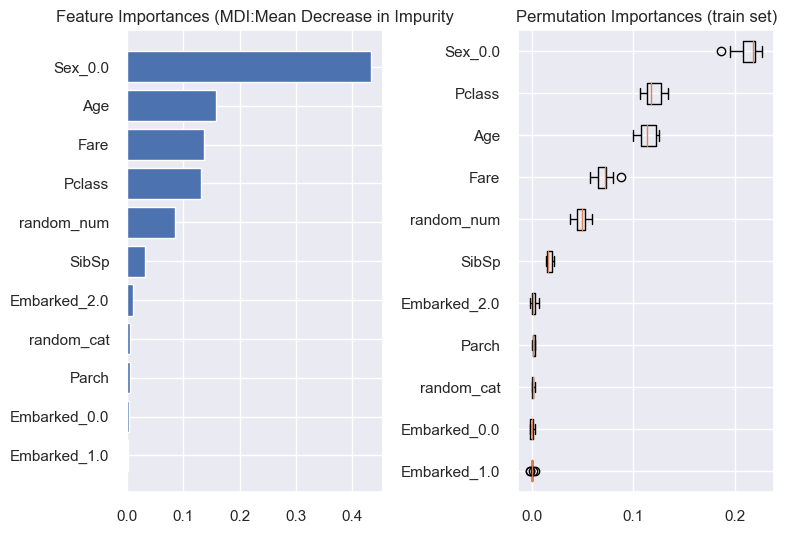

In [20]:
train_data_using_model = pd.concat((get_config("X_train"),get_config("y_train")),axis=1)
FI(model_top3[0], train_data_using_model, get_config("X_train").columns, Y_Cols)

- Stacked Model 이나 Ensemble 모델의 경우,
    - Permutation Feature Importance 는 Input 에 따른 반응을 지켜보며 결과를 반환
    - 기존의 Mean Decrease Impurity 방식의 Pre-defined Model Feature Importance 는 작동불가

FI failed


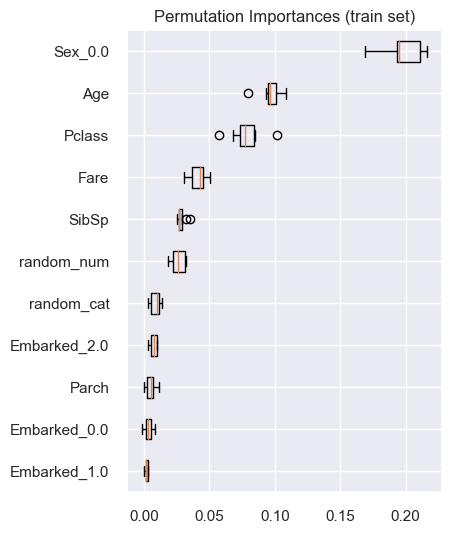

In [22]:
FI(stacked_m, train_data_using_model, get_config("X_train").columns, Y_Cols)

### PDP and ICE 
- PDP : Partial Dependency Plot - (Model-Agnostic-Global)
- ICE : Individual Conditional Expectation - (Model-Agnostic-Local)

#### Target and Actual Plot
- Target Plot 과 대비하여 모델의 출력값의 Trend를 비교 [Global]
- 전체적으로 1 dimentional view로 보았을 때 경향을 유지하도록 훈련된 것을 확인함

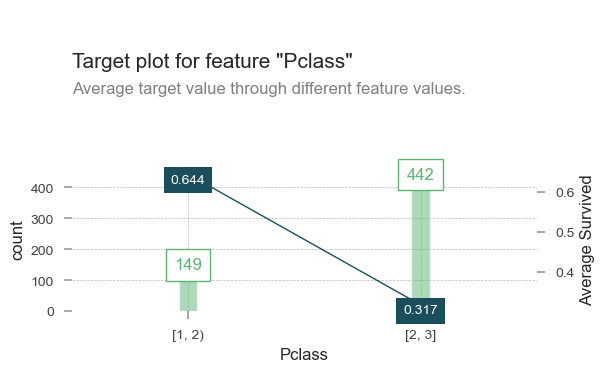

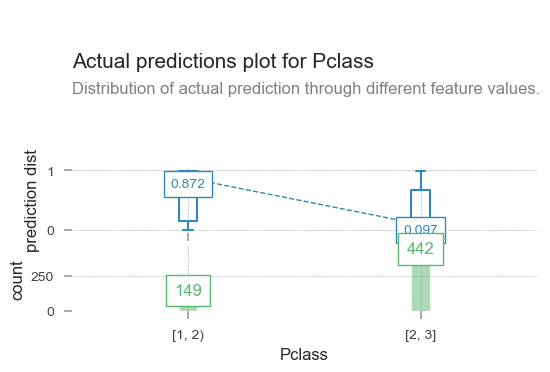

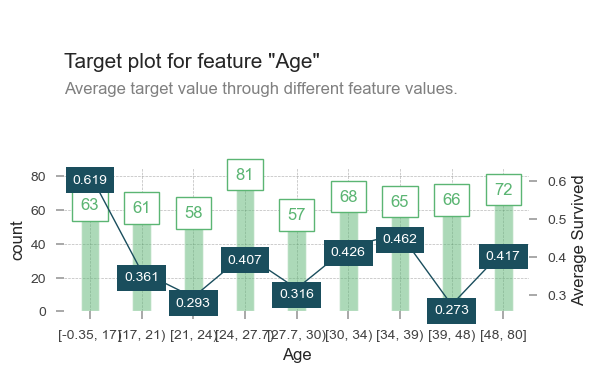

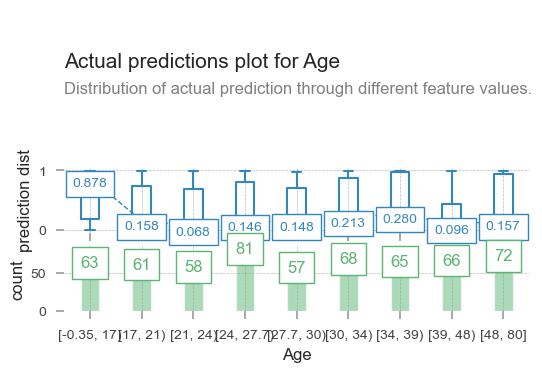

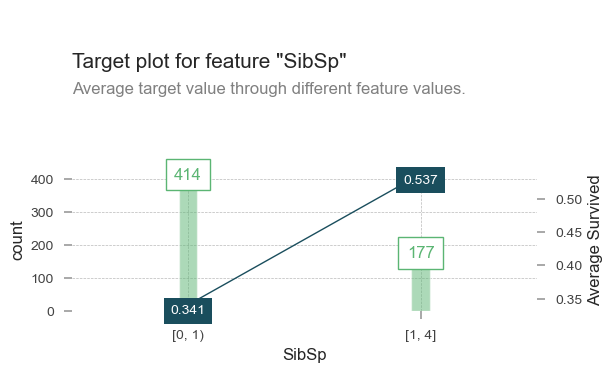

...

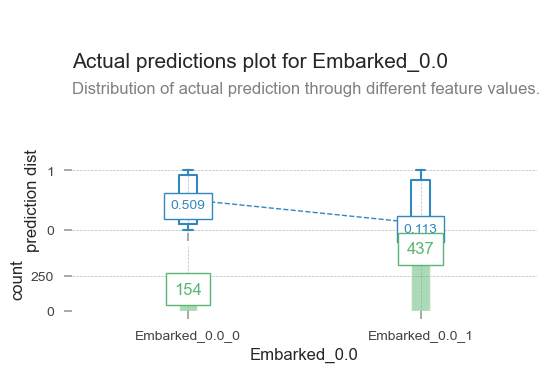

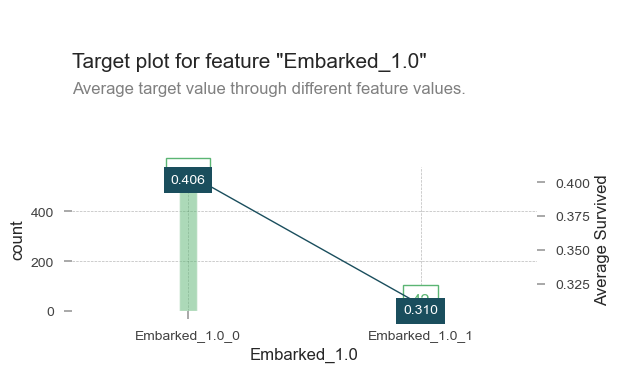

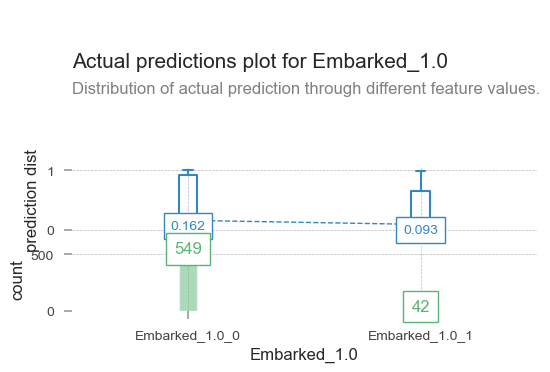

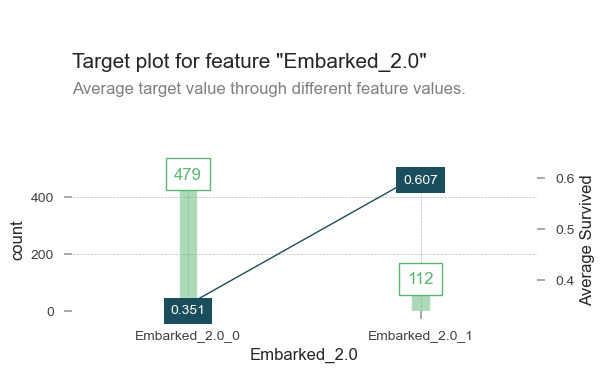

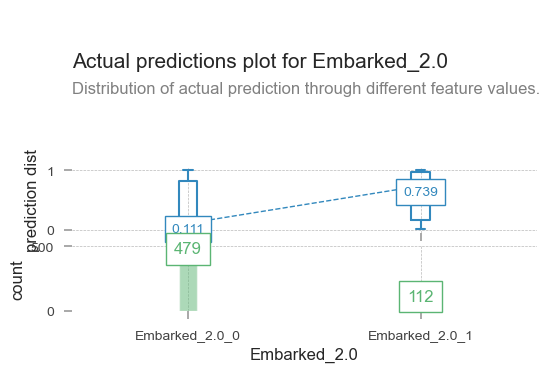

In [23]:
#target_plot (모델과 상관없이 사용 데이터) 대비 모델의 실제 결과를 체크
from pdpbox import pdp, get_dataset, info_plots

for col_i in get_config("X_train").columns:
    fig, axes, summary_df = info_plots.target_plot(df=train_data_using_model,
                                                   feature=col_i,
                                                   figsize=(6,4),
                                                   feature_name=col_i,
                                                   target=Y_Cols)
    fig, axes, summary_df = info_plots.actual_plot(model=tuned_model,
                                                   X=get_config("X_train"),
                                                   figsize=(6,4),
                                                   feature=col_i,
                                                   feature_name=col_i)

#### Partial Dependency Plot with Individual Conditional Expectation

PDP and ICE shows
1. 동일 조건에서 좌석 등급이 높을수록 생존에 유리
2. 동일 조건에서 10살 이상이면 나이는 생존율에 불리
3. 동일 조건에서 적당히 높은 요금제의 경우 생존율 높고 그 이후 큰 차이 없음
4. 여성이었다면 생존율에 유리
5. 동반가족의 경우 ICE로 볼 때, Case by Case

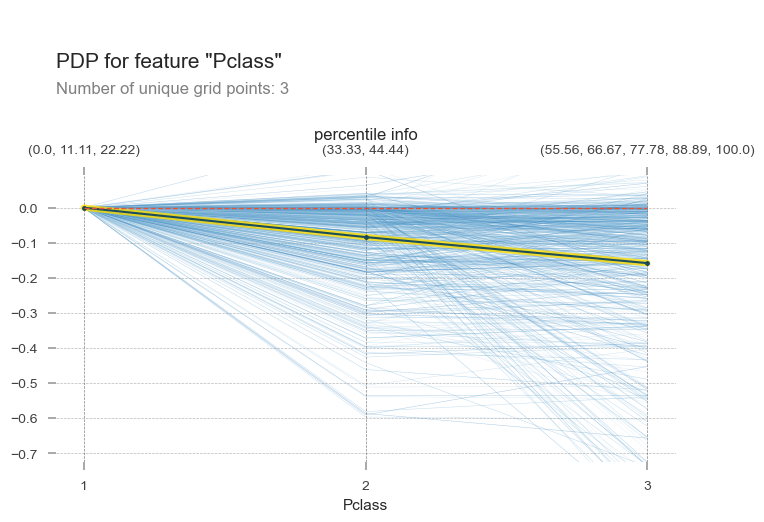

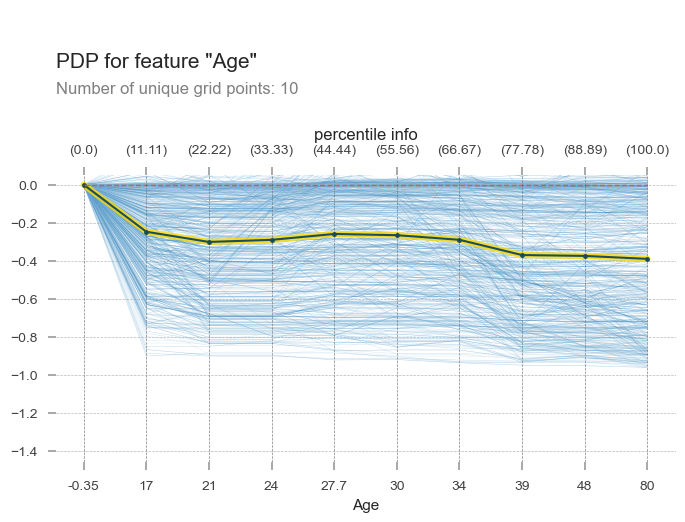

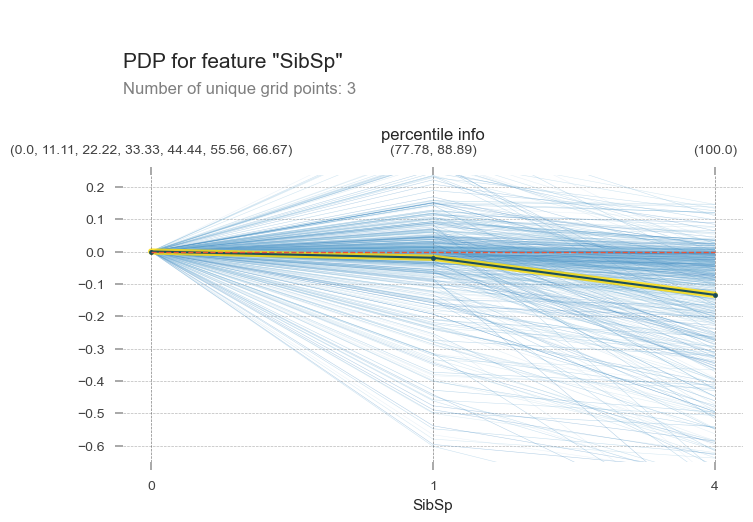

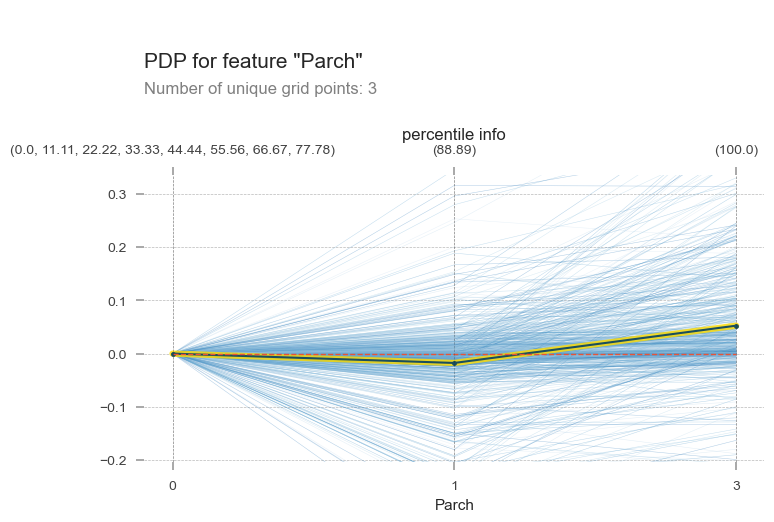

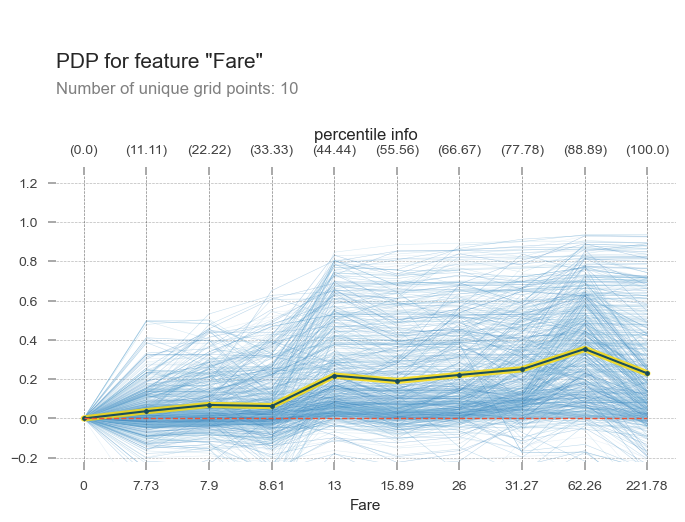

...

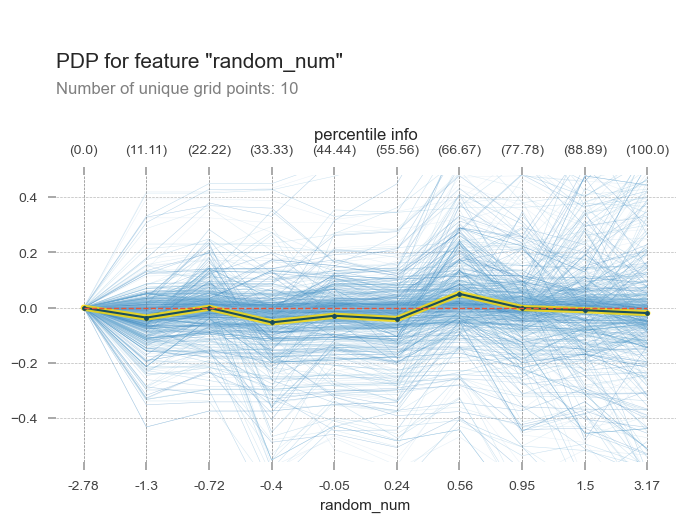

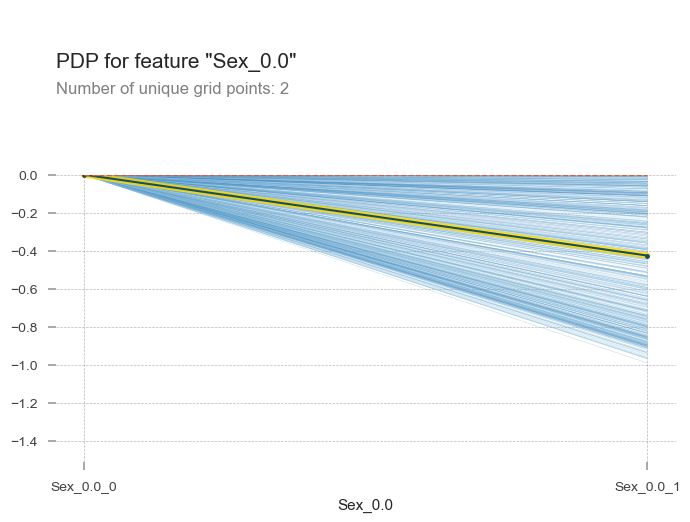

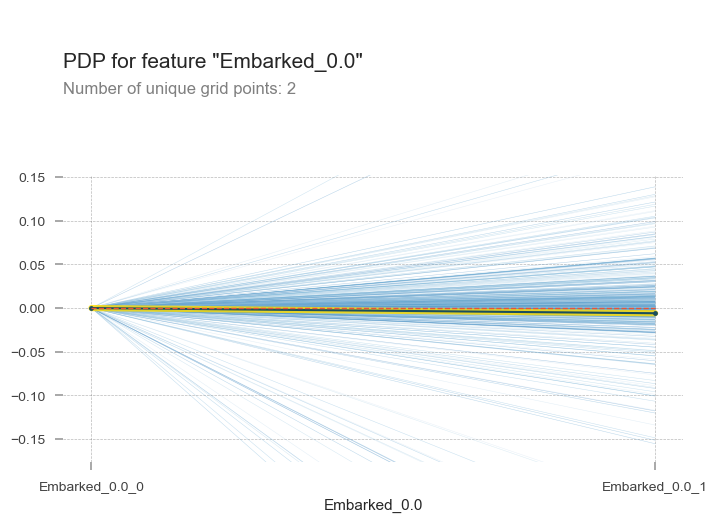

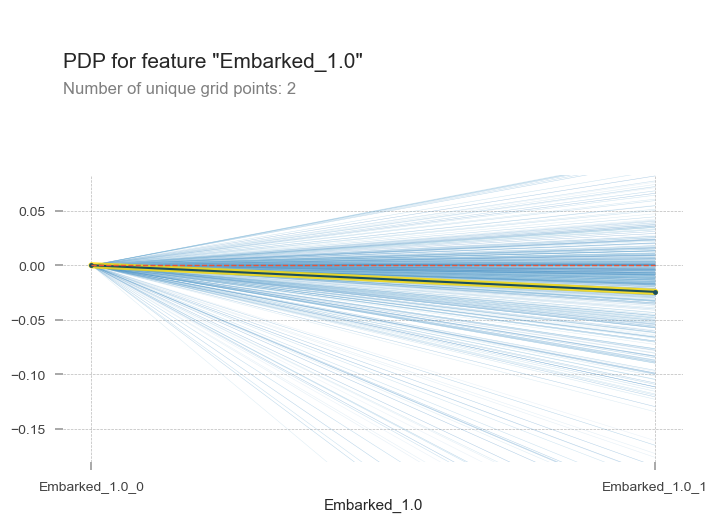

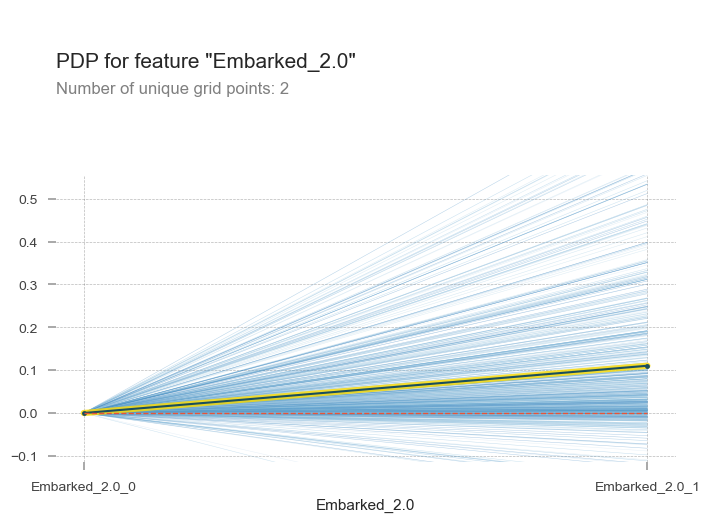

In [25]:
for col_i in get_config("X_train").columns:
    pdp_i = pdp.pdp_isolate(model=tuned_model,
                            dataset=train_data_using_model,
                            model_features=get_config("X_train").columns,
                            feature=col_i)

    fig, axes = pdp.pdp_plot(
        pdp_isolate_out=pdp_i,
        plot_lines=True,  # True : ICE - individual curve, False : PDP with ICE range
        center=True,
        #plot_pts_dist=True,
        x_quantile=True,
        show_percentile=True,
        figsize=(8, 6),
        ncols=2,
        feature_name=col_i) 

#### Target and Actual Plot - 2D

- 전반적인 경향을 학습한 상태를 확인
- Age와 Fare가 독립적으로도 영향관계가 존재하는 것을 확인
  - (단순 correlation 때문에 어느 하나가 관계있어 다른 하나가 관계있다고 보이는것만이 아님)

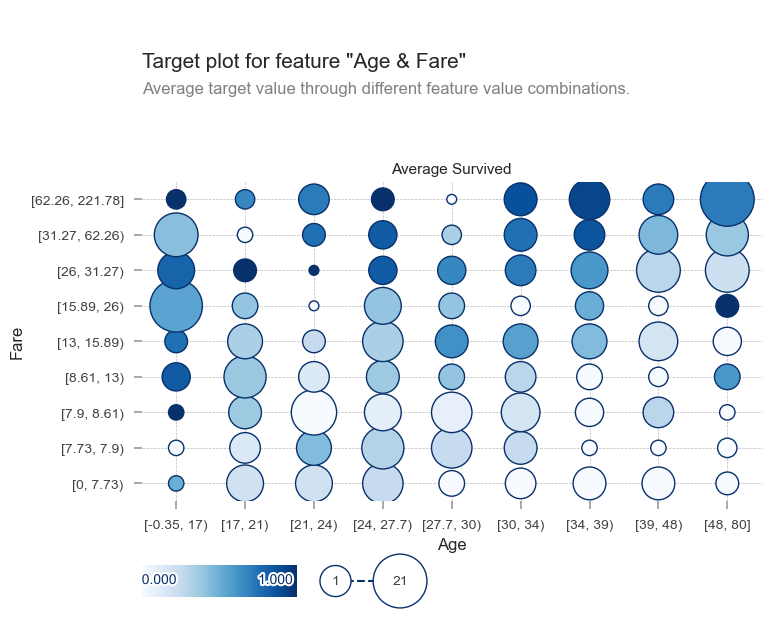

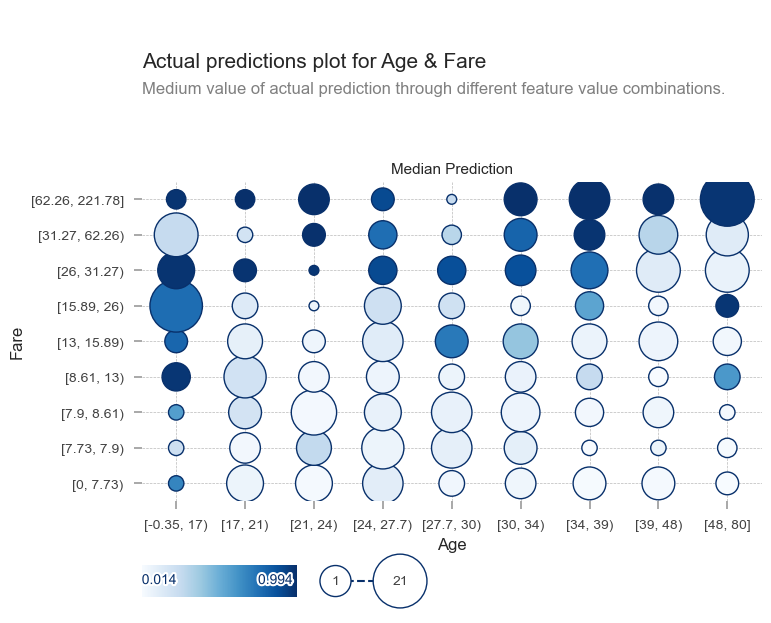

In [27]:
# note datasize and interactions
fig, axes, summary_df = info_plots.target_plot_interact(
    df=train_data_using_model,
    features=['Age', 'Fare'],
    feature_names=['Age', 'Fare'],
    target=Y_Cols,
    figsize=(8, 8))

fig, axes, summary_df = info_plots.actual_plot_interact(
    model=tuned_model,
    X=get_config("X_train"),
    features=['Age', 'Fare'],
    feature_names=['Age', 'Fare'],
    figsize=(8, 8))

In [ ]:
# heatmat to visualize interaction
inter1 = pdp.pdp_interact(model=tuned_model,
                          dataset=get_config("X_train"),
                          model_features=get_config("X_train").columns,
                          features=['Age', 'Fare'])

fig, axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,
                                  feature_names=['age', 'fare'],
                                  figsize=(8, 9),
                                  plot_type= 'grid', #'contour'
                                  x_quantile=True,
                                  plot_pdp=True)

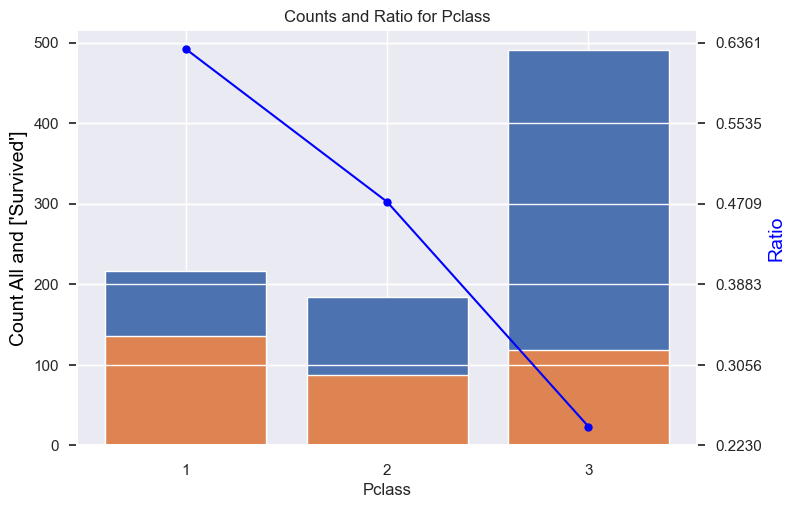

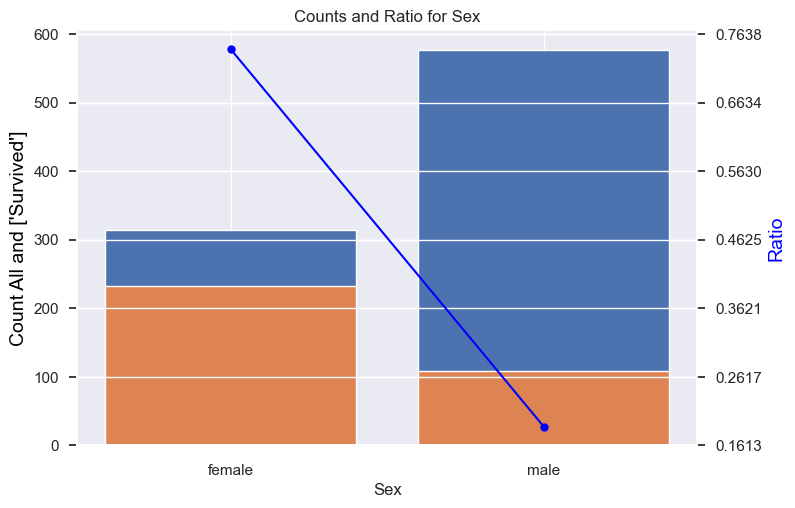

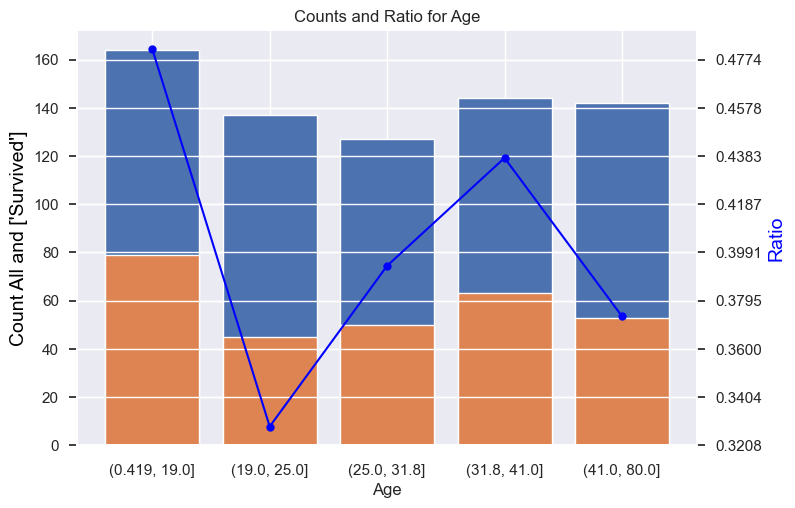

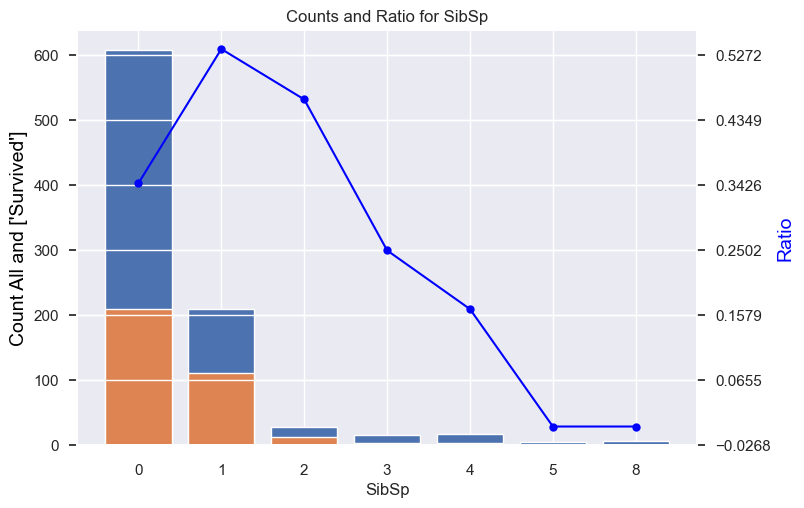

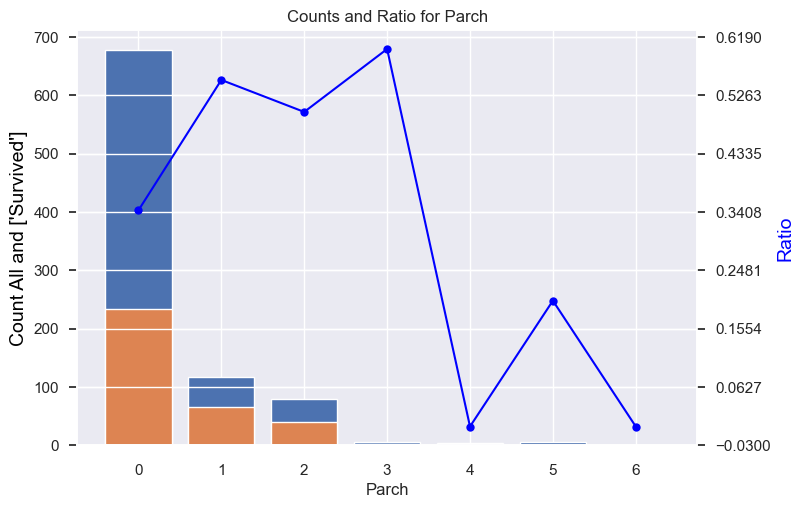

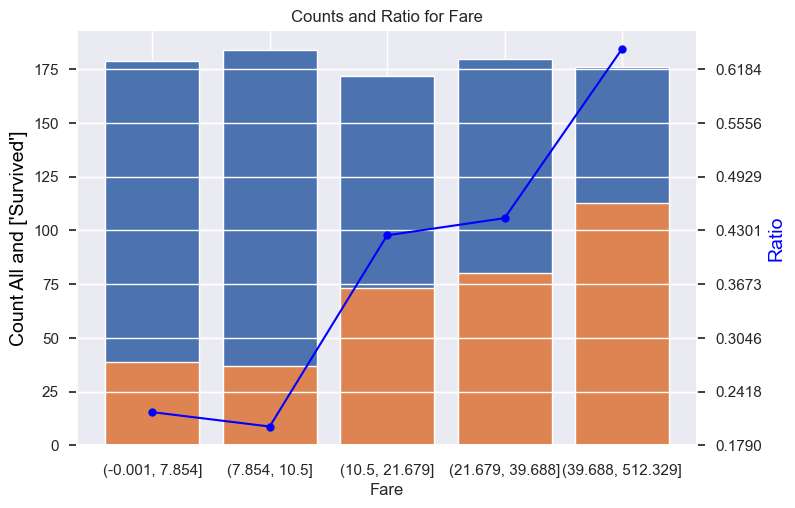

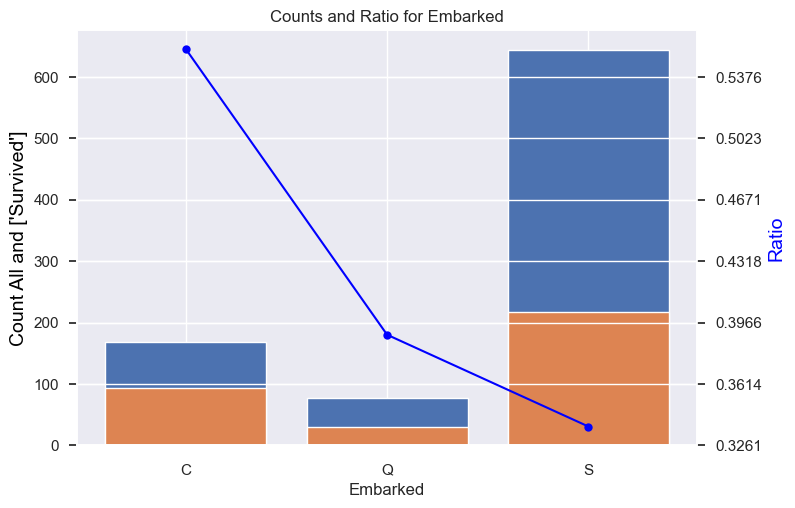

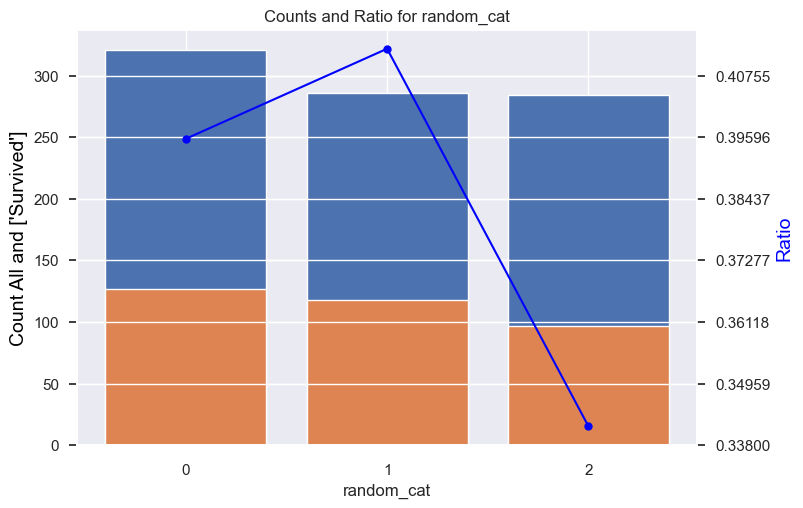

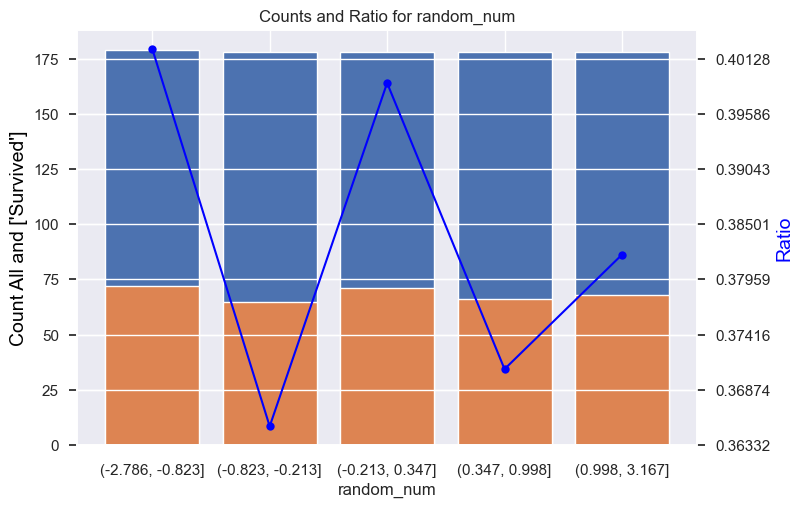

In [34]:
# Note target_plot is traditional EDA view !! 
ratio_plot(dataset0,Y_Cols)

### SHAP - SHapley Additive exPlanations


#### SHAP Feature Importance
- Model-Agnostic-Global and Local

In [58]:
#interpret_model(tuned_model)
#interpret_model(tuned_model, plot='correlation',kwargs={vmin})
import shap

# for normal cases
explainer = shap.Explainer(tuned_model)

expected_value = explainer.expected_value
shap_values = explainer(get_config("X_train"))

In [68]:
shap_values.base_values = shap_values.base_values.flatten()

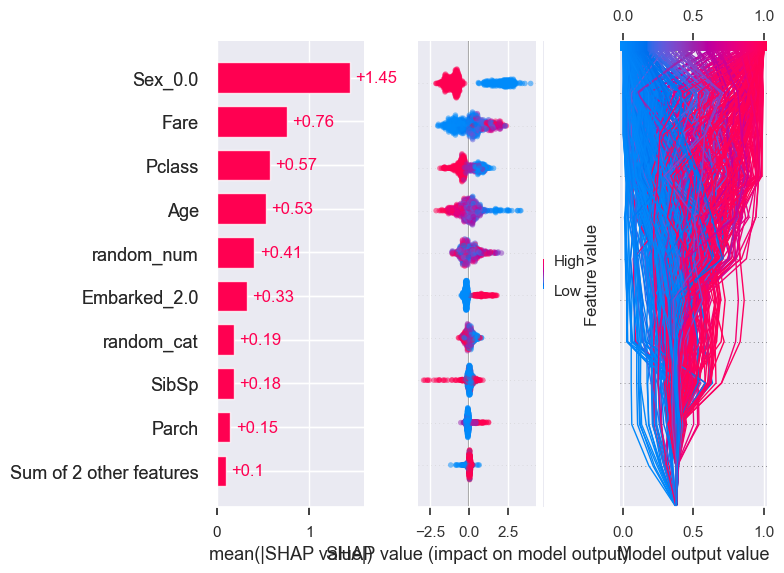

In [69]:
# summarize the effects of all the features
sns.set(font_scale=1.0)
plt.figure()

plt.subplot(1, 3, 1)
shap.plots.bar(shap_values, show=False)

plt.subplot(1, 3, 2)
shap.plots.beeswarm(shap_values, show=False, alpha=0.5)
plt.yticks([])

plt.subplot(1, 3, 3)
shap.decision_plot(explainer.expected_value,
                   shap_values.values,
                   get_config("X_train"),
                   link='logit',
                   show=False)
plt.yticks([])
plt.tight_layout()

#shap.summary_plot(shap_values, get_config("X_train"))

Global Feature 관점에서 PFI와 동일하게 Gender/P_Class, Fare/ Age 순서로 Y에 영향을 주는 형태로 나타나고 있다.
Local 관점에서 Gender 에 따라 극명하게 결과가 나뉘는(분포가 분리되어 있는) 형태임을 볼 수 있고, Pclass, Fare 에 대해서도 꽤 분리도가 높게 나타난다. 즉, 개별 data 또한 Gender/Pclass/Fare 의 global 경향(방향성)을 따른다는 것을 알 수 있다.

#### SHAP Local Explanations
- Note, for binary classification, logit (signal) will be 0~1 probability, waterfall curve show raw signal before logit function applying.

In [359]:
selection = 2
shap.initjs()
shap.force_plot(expected_value,
                shap_values.values[selection, :],
                get_config("X_train").iloc[selection, :],
                link='logit',
                #matplotlib=True,
                show=False)


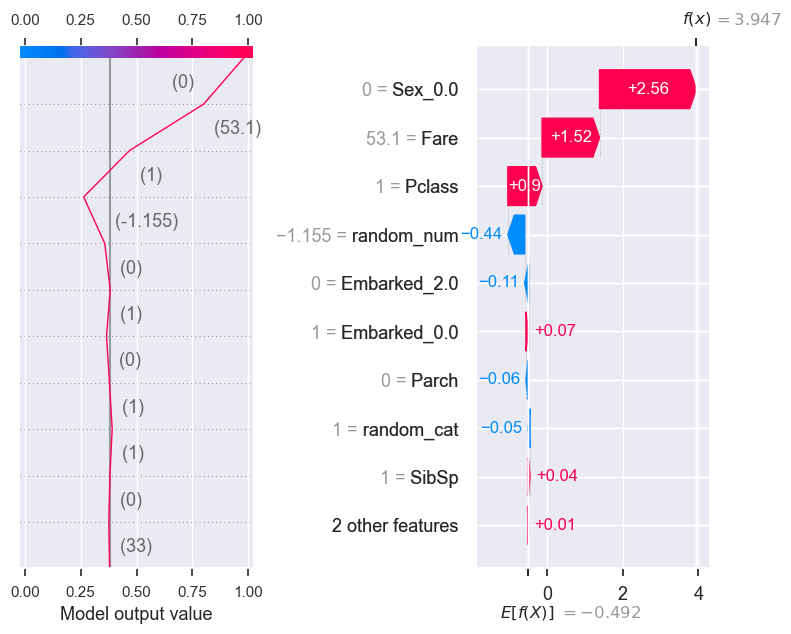

In [310]:
plt.figure(figsize=(8,6))
plt.subplot(1, 2, 1)
shap.decision_plot(explainer.expected_value,
                   shap_values.values[selection, :],
                   get_config("X_train").iloc[selection, :],
                   link='logit',
                   show=False)
plt.yticks([])

plt.subplot(1, 2, 2)
shap.plots.waterfall(shap_values[selection], show=False)

plt.tight_layout()

#### SHAP Local/Global Explanations

아래 interprete_model 을 통해 3가지 큰 부류확인
- 여성이어서 살아남은 부류 : 생존율 가장 높은 그룹
- 남성이지만,비싼 요금의 표와 1등 class 탑승객 : 2번째 생존율 높은 그룹
- 그 외 : 생존율 낮은 그룹

In [361]:
# visualize all the training set predictions
# shap.plots.force(shap_values)
#interpret_model(tuned_model, plot='reason')

shap.force_plot(expected_value,
                shap_values.values,
                get_config("X_train"),
                link='logit',
                #matplotlib=True,
                show=False)

#### SHAPly values VS. features per instance
모델은 아래와 같이 학습되었음 (실제 현상이 그런것이 아니라 모델이 그렇다는 것)
- 좌석등급이 높을수록(3-->2-->1), Y값을 증가시키는 방향 우세 (좌석등급 최하 3에서는 여성이 더 생존율이 낮음을 유의)
- 10살 미만에서 대부분 Y값의 기여가 양수이며 이 때 남여 영향관계가 보이지 않음. 그 이상 나이대에서는 여성의 생존율 높음
- 부모/자식 수직가족관계에서 혼자인 경우 여성의 생존율이 높음
- 요금 50 이상에서는 생존에 매우 유리

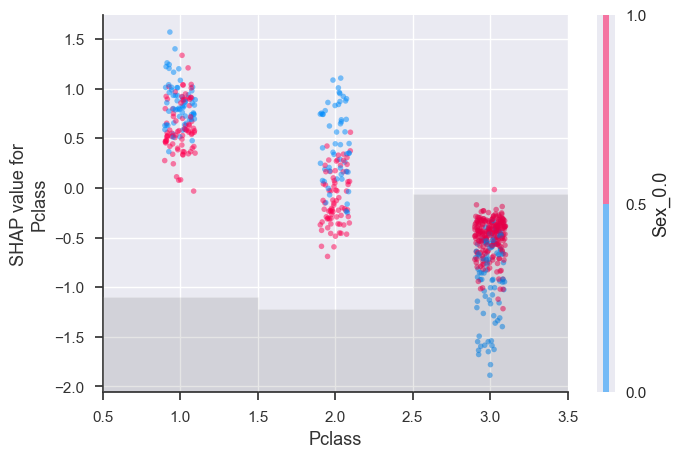

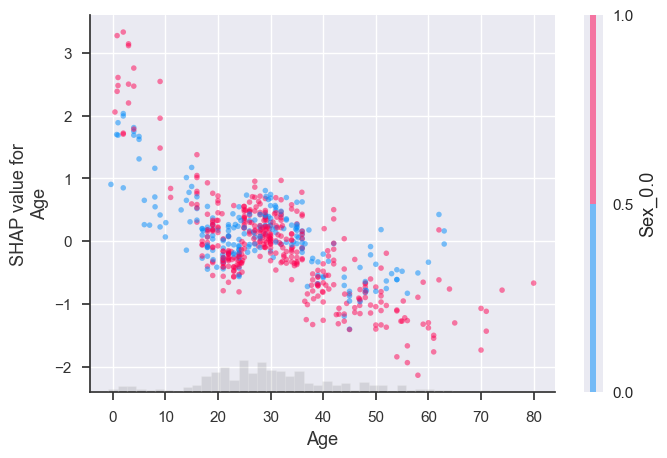

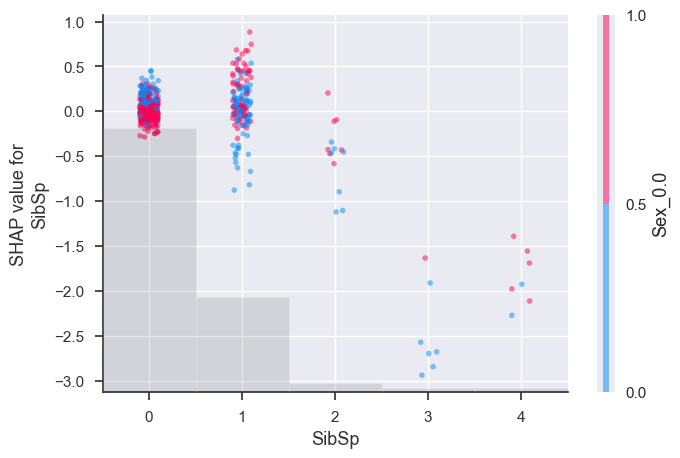

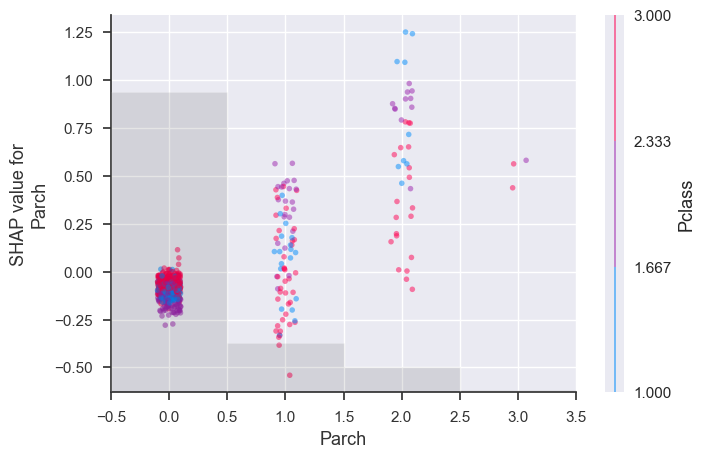

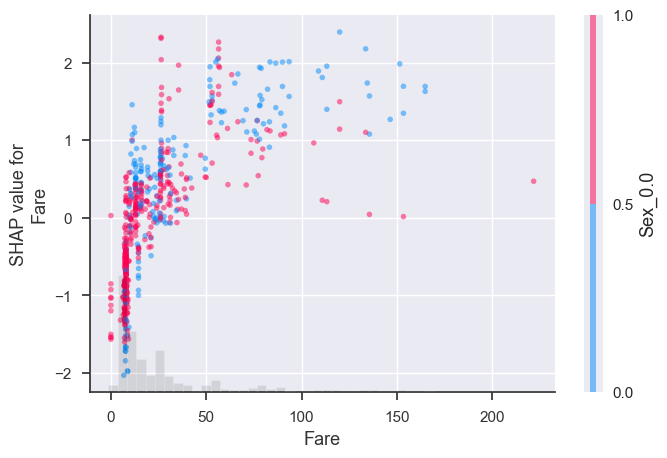

...

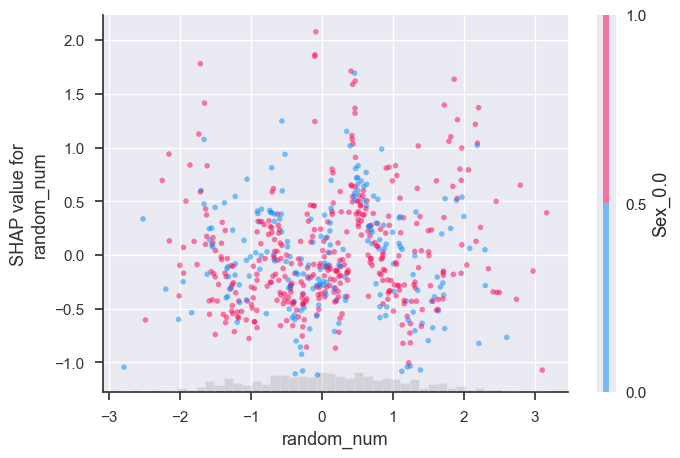

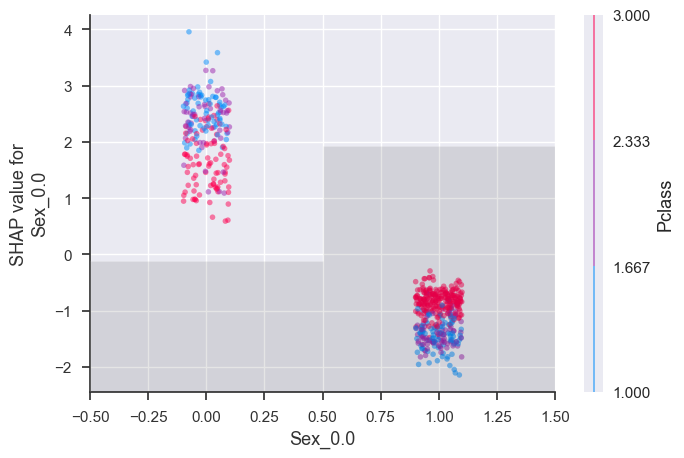

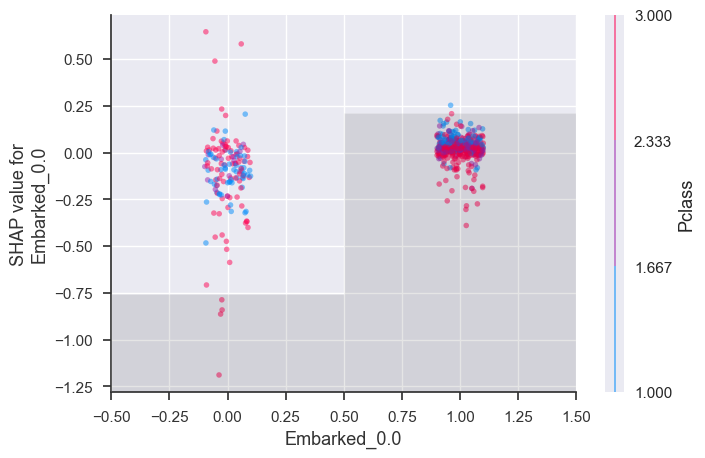

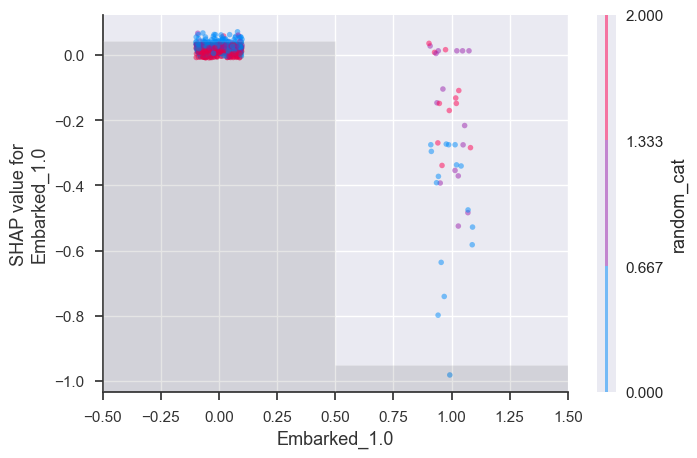

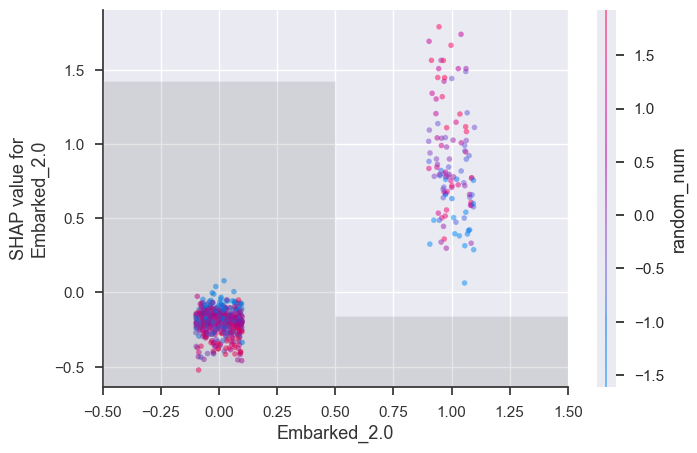

In [77]:
# SHAP - Corrleation
for col_i in get_config("X_train").columns:
    shap.plots.scatter(shap_values[:, col_i], color=shap_values, alpha=0.5)

In [52]:
shap_values.shape

(591, 11)

In [ ]:
# visualize all the training set predictions
#shap.force_plot(explainer.expected_value,shap_values)
#shap.force_plot(explainer.expected_value, shap_values, get_config("X_train"))

- SHAP introduction : https://datanetworkanalysis.github.io/2019/12/24/shap2, https://datanetworkanalysis.github.io/2019/12/24/shap3
- LIME introduction : https://moondol-ai.tistory.com/396

- SHAP decision plot https://data-newbie.tistory.com/254

In [ ]:
#interpret_model(tuned_model,plot='correlation',feature=get_config('X_train').columns[0])

In [ ]:
# sklearn partial_dependency
'''
import matplotlib.pyplot as plt
#from sklearn.inspection import partial_dependence
#from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence

plot_partial_dependence(model_top3[2], X=get_config('X_train'), 
                        features=get_config('X_train').columns[1:2],
                        grid_resolution=20)
'''

<AxesSubplot:xlabel='Age'>

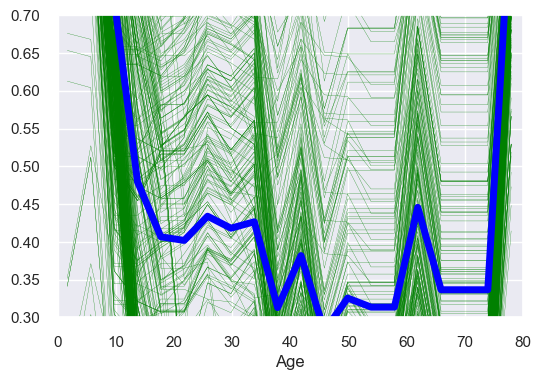

In [91]:
# Simple PDP and ICE check
ref_data = get_config('X_train').copy()
ref_data = ref_data.reset_index(drop=True).reset_index()
ref_data_expand = pd.DataFrame()
target_col_i = ref_data.columns[2]

Xs_grid = np.linspace(ref_data[target_col_i].min(),
                      ref_data[target_col_i].max(),
                      num=20)

for grid_i in Xs_grid:
    ref_data[target_col_i] = grid_i
    ref_data_expand = pd.concat((ref_data_expand, ref_data), axis=0)

ref_data_expand['Y_hat'] = model_top3[0].predict_proba(
    ref_data_expand[ref_data_expand.columns[1:]])[:, 1]

plt.figure(figsize=(6, 4))
ax = plt.subplot(1, 1, 1)
ss = pd.cut(ref_data_expand['Age'], 20)
s = [(i.left + i.right) / 2 for i in ss.values]
ref_data_expand['Age'] = s


# ICE
ref_data_expand.pivot_table(index='Age', columns='index',
                            values='Y_hat').plot(xlim=[0, 80],
                                                 ylim=[0, 1],
                                                 legend=[],
                                                 c='green',
                                                 lw=0.2,
                                                 ax=ax)

# PDP
ref_data_expand.groupby('Age')['Y_hat'].mean().plot(xlim=[0, 80],
                                                    ylim=[0.30, 0.70],
                                                    lw=5,
                                                    c='blue',
                                                    ax=ax)

"\nexplainer = shap.TreeExplainer(tuned_model)\nexplainer.shap_values(get_config('X_train')) # <- it always works \n#shap_interaction_values = explainer.shap_interaction_values(get_config('X_train'))\n"

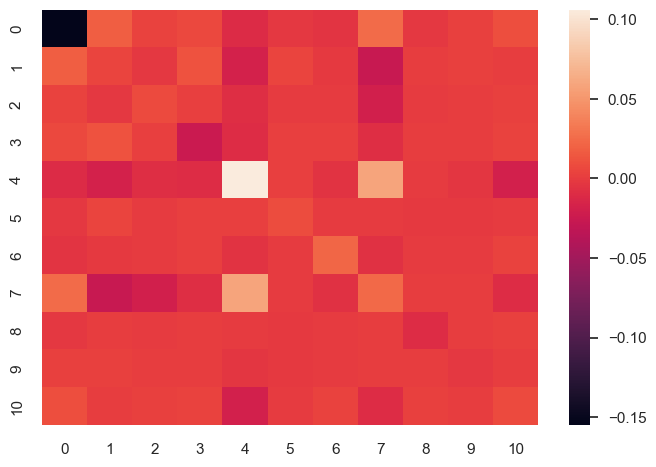

In [99]:
shap_interaction_values  = explainer.shap_interaction_values(get_config('X_train'))
sns.heatmap(shap_interaction_values.mean(axis=(0)))
'''
explainer = shap.TreeExplainer(tuned_model)
explainer.shap_values(get_config('X_train')) # <- it always works 
#shap_interaction_values = explainer.shap_interaction_values(get_config('X_train'))
'''

In [ ]:
help(get_config())

### LIME 
- LIME example and script was prepared by SY.Oh
- Please find More Details in Ref [https://github.com/sooeun67/xai/blob/main/lime/titanic/titanic_lime.ipynb]
#### Local Explanations

In [100]:
import lime.lime_tabular

In [101]:
# Defining our LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(get_config('X_train').values,
                                                        mode = 'classification',
                                                        feature_names = get_config('X_train').columns,
                                                        class_names = ['Did Not Survive', 'Survived']
                                                        )


In [354]:
# Defining a quick function that can be used to explain the instance passed
selection = 1
print(train.iloc[get_config("X_train").index[selection]].Name)


predict_rfc_prob = lambda x: tuned_model.predict_proba(x).astype(float)

person_1 = get_config('X_train').iloc[selection]
person_1_lime = lime_explainer.explain_instance(person_1.values,
                                                predict_rfc_prob,
                                                num_features=15)
person_1_lime.show_in_notebook()

Ali, Mr. William


In [355]:
print("Explanation Local Prediction              : ", person_1_lime.local_pred)
print("Explanation Global Prediction Probability : ", person_1_lime.predict_proba)

Explanation Local Prediction              :  [-0.03548863]
Explanation Global Prediction Probability :  [0.94508331 0.05491669]


In [336]:
selection = 1
print(train.iloc[get_config("X_train").index[selection]].Name)

shap.initjs()
shap.force_plot(expected_value,
                shap_values.values[selection, :],
                get_config("X_train").iloc[selection, :],
                link='logit',
                #matplotlib=True,
                show=False)


Ali, Mr. William


정도의 차이는 존재하나 LIME, SHAP 모두 person1 에 대해 
- SibSp 와 Age 에 의해 생존확률은 증가, 요금과 성별 및 좌석Class에 따라 생존확률 감소를 나타냄

In [131]:
pred_y = tuned_model.predict_proba(get_config('X_train'))

In [356]:
# Defining a quick function that can be used to explain the instance passed
selection = 0
print(train.iloc[get_config("X_train").index[selection]].Name)

person_0 = get_config('X_train').iloc[selection]
person_0_lime = lime_explainer.explain_instance(person_0.values,
                                                predict_rfc_prob,
                                                num_features=15)
person_0_lime.show_in_notebook()

Nakid, Miss. Maria ("Mary")


In [358]:
print("Explanation Local Prediction              : ", person_0_lime.local_pred)
print("Explanation Global Prediction Probability : ", person_0_lime.predict_proba)

Explanation Local Prediction              :  [0.96341372]
Explanation Global Prediction Probability :  [0.07438474 0.92561526]


In [335]:
shap.initjs()
shap.force_plot(expected_value,
                shap_values.values[selection, :],
                get_config("X_train").iloc[selection, :],
                link='logit',
                #matplotlib=True,
                show=False)

정도의 차이는 존재하나 LIME, SHAP 모두 person 0 에 대해 
- 요금, Parch, 성별, 나이,탑승항에 의해 생존확률 증가. 좌석등급에 의해 생존확률 감소를 나타냄.
- 단, 1st 생존확률 증가 설명변수가 SHAP는 나이(1살)이며 LIME 은 성별로 얘기하고 있음.

mean Pclass : 2.274111747741699, mean Y_hat : 0.39993123151890125
selection Pclass : 3.0, selection Y_hat : 0.05491668926702023
selection Shapley Val : [-0.07971596]
mean Age : 30.24428276767875, mean Y_hat : 0.39993123151890125
selection Age : 25.0, selection Y_hat : 0.05491668926702023
selection Shapley Val : [0.09139381]
mean SibSp : 0.3824027180671692, mean Y_hat : 0.39993123151890125
selection SibSp : 0.0, selection Y_hat : 0.05491668926702023
selection Shapley Val : [0.02072368]
mean Parch : 0.2825719118118286, mean Y_hat : 0.39993123151890125
selection Parch : 0.0, selection Y_hat : 0.05491668926702023
selection Shapley Val : [-0.01472829]
mean Fare : 26.846616744995117, mean Y_hat : 0.39993123151890125
selection Fare : 7.050000190734863, selection Y_hat : 0.05491668926702023
selection Shapley Val : [-0.21680699]
mean random_cat : 0.9560067653656006, mean Y_hat : 0.39993123151890125
selection random_cat : 2.0, selection Y_hat : 0.05491668926702023
selection Shapley Val : [-7.959

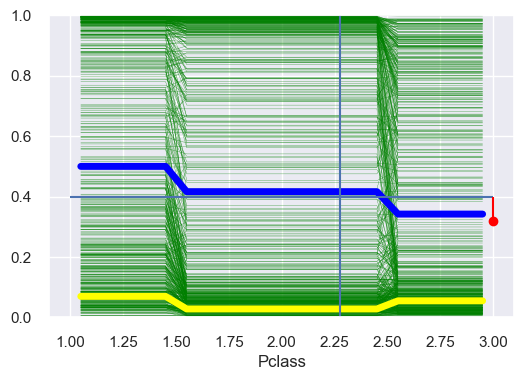

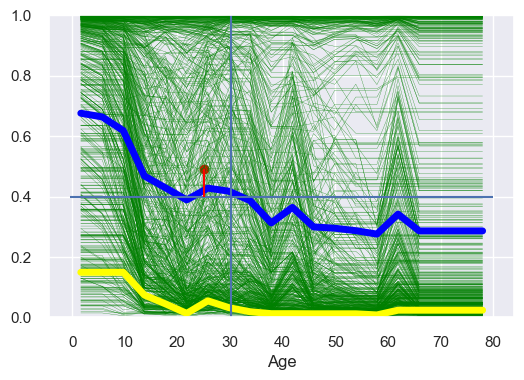

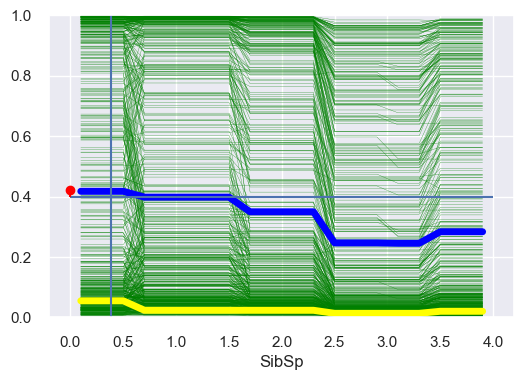

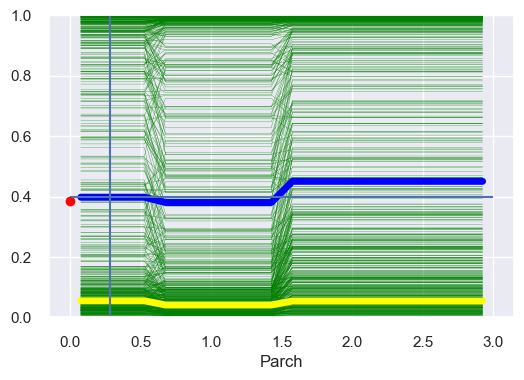

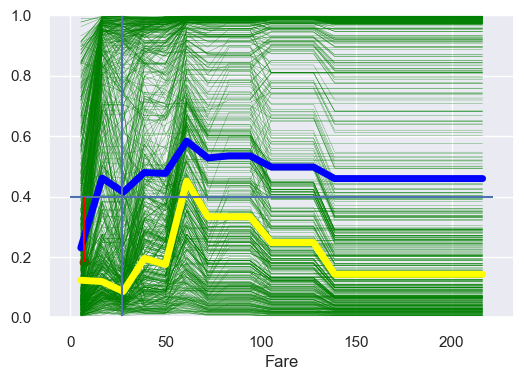

...

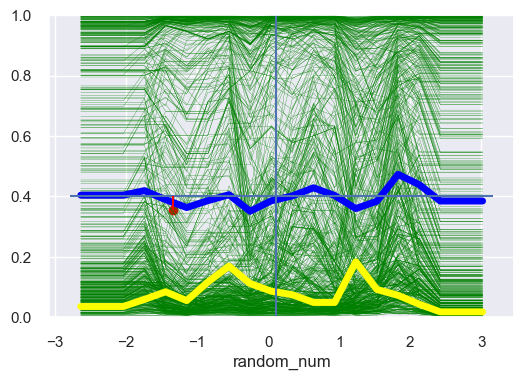

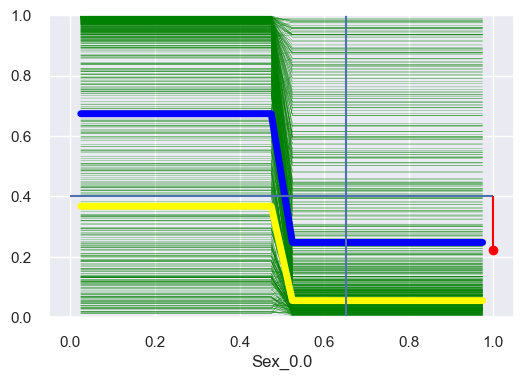

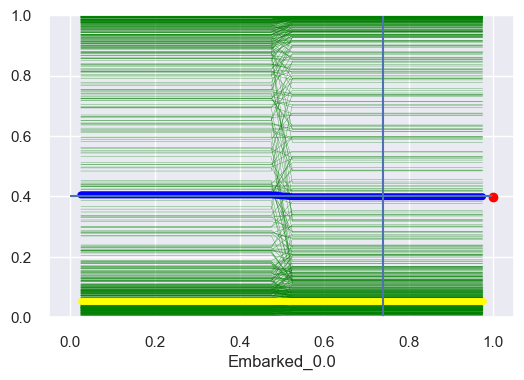

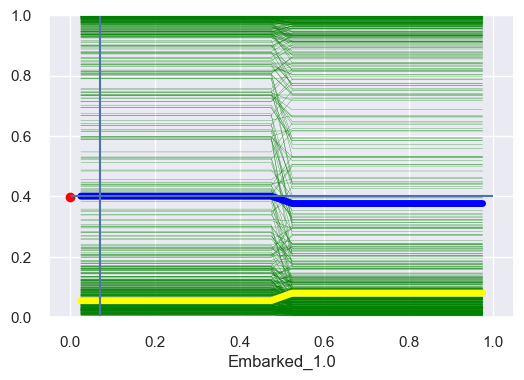

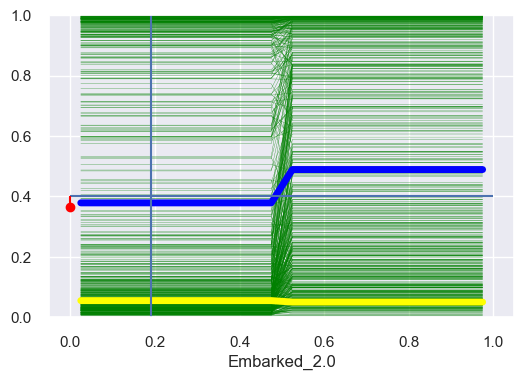

In [334]:

# Simple PDP and ICE check
selection = 1

for col_i in get_config('X_train').columns:
#col_i = 'Age'
    ref_data = get_config('X_train').copy()
    ref_data = ref_data.reset_index(drop=True).reset_index()
    ref_data_expand = pd.DataFrame()
    target_col_i = col_i
    col_i_idx = np.where(get_config('X_train').columns==col_i)[0][0]
    selected_idx = ref_data.iloc[selection]["index"].astype(int)


    from scipy.special import logit, expit

    Xs_grid = np.linspace(ref_data[target_col_i].min(),
                          ref_data[target_col_i].max(),
                          num=20)

    for grid_i in Xs_grid:
        ref_data[target_col_i] = grid_i
        ref_data_expand = pd.concat((ref_data_expand, ref_data), axis=0)

    ref_data_expand['Y_hat'] = tuned_model.predict_proba(
        ref_data_expand[ref_data_expand.columns[1:]])[:, 1]

    plt.figure(figsize=(6, 4))
    ax = plt.subplot(1, 1, 1)
    ss = pd.cut(ref_data_expand[col_i], 20)
    s = [(i.left + i.right) / 2 for i in ss.values]
    ref_data_expand[col_i] = s


    # ICE
    ref_data_expand.pivot_table(index=col_i, columns='index',
                                values='Y_hat').plot(#xlim=[0, 80],
                                                     ylim=[0, 1],
                                                     legend=[],
                                                     c='green',
                                                     lw=0.2,
                                                     ax=ax)
    # ICE - selection

    ref_data_expand[ref_data_expand['index']==selected_idx].groupby(col_i)['Y_hat'].mean().plot(#xlim=[0, 80],
                                                        ylim=[0, 1],
                                                        lw=5,
                                                        c='yellow',
                                                        ax=ax)

    # PDP
    ref_data_expand.groupby(col_i)['Y_hat'].mean().plot(#xlim=[0, 80],
                                                        ylim=[0, 1],
                                                        lw=5,
                                                        c='blue',
                                                        ax=ax)

    y_hat = tuned_model.predict_proba(get_config('X_train'))[:, 1]
    y_hat_mean = np.mean(y_hat)
    x_mean = np.mean(get_config('X_train')[col_i])
    x_i = get_config('X_train').iloc[selection:selection+1,col_i_idx:col_i_idx+1].values[0,0]
    plt.hlines(y=y_hat_mean,xmin=get_config('X_train')[col_i].min(),xmax=get_config('X_train')[col_i].max())
    plt.vlines(x=x_mean,ymin=0,ymax=1)

    shap_val_selection = shap_values[selection:selection+1,col_i_idx:col_i_idx+1].values[0,0]
    shap_val_mean = np.mean((shap_values[:,col_i_idx:col_i_idx+1].values))
    shap_val_selection_expit = expit(expected_value + shap_val_selection) - expit(expected_value )

    y_1 = y_hat_mean + shap_val_selection_expit
    y_2 = y_hat_mean

    print(f"mean {col_i} : {x_mean}, mean Y_hat : {y_hat_mean}")
    print(f"selection {col_i} : {x_i}, selection Y_hat : {y_hat[selection]}")
    print(f"selection Shapley Val : {shap_val_selection_expit}")

    y_max_val = max(y_1, y_2)
    y_min_val = min(y_1, y_2)

    plt.vlines(x=x_i,ymin=y_min_val,ymax=y_max_val,colors='red')
    plt.scatter(x=x_i, y=y_1,c='red')